# Customer Growth and CRM

This notebook covers analysis for answering questions related to the Customer Growth and CRM team.
1. How have repeat purchase patterns changed over the last 24–36 months, segmented by acquisition channel, demographics (age/gender), and location?
2. Which customer behaviours and characteristics best predict long-term value (e.g. first-purchase category, time to second order), where long-term value is defined by revenue and profit?
3. Which customer groups consistently drive disproportionate revenue?
4. Where do post-purchase drop-offs occur (e.g. returns, low engagement), and how do these vary by segment?

## Data loading and preparation

Load data and prepare tables to be used for analysis.

In [75]:
# load modules
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [76]:
# load data
dist_ctrs = pd.read_parquet("../data/clean/distribution_centers.parquet")
events = pd.read_parquet("../data/clean/events.parquet")
inv_items = pd.read_parquet("../data/clean/inventory_items.parquet")
order_items = pd.read_parquet("../data/clean/order_items.parquet")
orders = pd.read_parquet("../data/clean/orders.parquet")
products = pd.read_parquet("../data/clean/products.parquet")
users = pd.read_parquet("../data/clean/users.parquet")

### Customer ABT

In [77]:
# static and direct features
customer_abt = users.copy()

customer_abt = customer_abt.rename(columns={'traffic_source': 'acquisition_channel'})

# determine analysis date: end of last month with transactions
last_date = max(
    orders['created_at'].max(),
    order_items['created_at'].max(),
    ) - pd.offsets.MonthEnd(0)

customer_abt['analysis_date'] = last_date.normalize()

# define the age_bin
customer_abt['age_bin'] = pd.cut(
    customer_abt['age'],
    bins=range(10, 81, 10),
    right=False
)

customer_abt = customer_abt[['user_id', 'analysis_date', 'age_bin', 'gender', 'country']].copy()

# first purchase features

# start with all orders
customer_order_items = orders.merge(order_items, on='order_id').merge(products[['product_id', 'category', 'cost']], on='product_id')
customer_order_items = customer_order_items.rename(columns={
    'user_id_x': 'user_id',
    'created_at_x': 'order_date',
    'created_at_y': 'order_item_date'
})

# calculate profit
customer_order_items['profit'] = customer_order_items['sale_price'] - customer_order_items['cost']

# identify first order date per user
first_order_date = customer_order_items.groupby('user_id')['order_date'].min().reset_index(name='first_purchase_date')

# identify first order rows from first order date
first_order_rows = customer_order_items.merge(first_order_date.rename(columns={'first_purchase_date': 'order_date'}), on=['user_id', 'order_date'])

# calcualte first order aggregates
first_order_features = first_order_rows.groupby('user_id').agg(
    first_purchase_date=('order_date', 'first'),
    first_order_revenue=('sale_price', 'sum'),
    first_order_profit=('profit', 'sum'),
    first_order_item_count=('order_id', 'count')
).reset_index()

# calculate first purchase category
first_order_category = first_order_rows.groupby(['user_id', 'category']).agg(
    category_profit=('profit', 'sum')
).reset_index()
first_order_category = first_order_category.sort_values(by=['user_id', 'category_profit'],ascending=[True, False])
first_order_category = first_order_category.groupby('user_id').head(1)[['user_id', 'category']]
first_order_category = first_order_category.rename(columns={'category': 'first_purchase_category'})

# combine and add cohort month
first_order_features = first_order_features.merge(first_order_category, on='user_id', how='left')
first_order_features['acquisition_month'] = first_order_features['first_purchase_date'].dt.to_period('M').dt.to_timestamp()

# merge with customer_abt
customer_abt = customer_abt.merge(first_order_features, on='user_id')


# calculate date differece features

# calculate previous order dates
customer_orders = orders.sort_values(['user_id', 'created_at'])
customer_orders['prev_order_date'] = customer_orders.groupby('user_id')['created_at'].shift(1)

# average days between orders
customer_orders['days_between_orders'] = (customer_orders['created_at'] - customer_orders['prev_order_date']).dt.days
avg_days_between_orders = customer_orders.groupby('user_id')['days_between_orders'].mean().reset_index(name='avg_days_between_orders')

# days since first purchase
customer_abt['days_since_first_purchase'] = (customer_abt['analysis_date'] - customer_abt['first_purchase_date']).dt.days

# time to second order
customer_orders['order_number'] = customer_orders.groupby('user_id')['created_at'].rank(method='dense').astype(int)
second_orders = customer_orders[customer_orders['order_number'] == 2].groupby(['user_id', 'created_at']).head(1)
second_orders = second_orders[['user_id', 'created_at']].rename(columns={'created_at': 'second_order_date'})

# merge with customer_abt
customer_abt = customer_abt.merge(second_orders, on='user_id', how='left')
customer_abt = customer_abt.merge(avg_days_between_orders, on='user_id', how='left')
customer_abt['time_to_second_order'] = (customer_abt['second_order_date'] - customer_abt['first_purchase_date']).dt.days


# calculate horizon attributes

# add first_purchase date onto order_items
customer_order_items_fp = customer_order_items.merge(customer_abt[['user_id', 'first_purchase_date']], on='user_id')

# determine days since first order
customer_order_items_fp['days_since_first'] = (customer_order_items_fp['order_date'] - customer_order_items_fp['first_purchase_date']).dt.days

# specify desired horizons
horizons = [30, 90, 180, 365, 540]

for h in horizons:
    mask = (customer_order_items_fp['days_since_first'] <= h) & (customer_order_items_fp['days_since_first'] >= 0)
    horizon_orders = customer_order_items_fp[mask].groupby('user_id').agg(
        **{f'orders_{h}d':('order_id', 'nunique'),
          f'revenue_{h}d':('sale_price', 'sum'),
          f'profit_{h}d':('profit', 'sum')}
    ).reset_index()
    
    customer_abt = customer_abt.merge(horizon_orders, on='user_id')
    
    customer_abt[f'has_repeat_{h}d'] = (customer_abt[f'orders_{h}d'] >= 2).astype(int)


# calculate lifetime value

lifetime_features = customer_order_items.groupby('user_id').agg(
    total_orders=('order_id', 'nunique'),
    total_items=('order_item_id', 'nunique'),
    lifetime_revenue=('sale_price', 'sum'),
    lifetime_profit=('profit', 'sum'),
    last_order_date=('order_date', 'last') 
).reset_index()

customer_abt = customer_abt.merge(lifetime_features, on='user_id')
customer_abt['lifetime_AOV'] = customer_abt['lifetime_revenue'] / customer_abt['total_orders']
customer_abt['days_since_last_order'] = (customer_abt['analysis_date'] - customer_abt['last_order_date']).dt.days


# churn, returns, and engagement

# churn
horizons = [30, 90, 180, 365]
for h in horizons:
    customer_abt[f'churned_{h}d'] = (customer_abt['days_since_last_order'] > h).astype(int)

# returns
cancelled_order_items = customer_order_items[customer_order_items['status_y'] == 'Cancelled']
returned = cancelled_order_items.groupby('user_id').agg(
    items_returned=('order_item_id', 'nunique'),
    orders_returned=('order_id', 'nunique')
).reset_index()

customer_abt = customer_abt.merge(returned, on='user_id', how='left')

customer_abt['order_return_rate'] = customer_abt['orders_returned'] / customer_abt['total_orders']
customer_abt['item_return_rate'] = customer_abt['items_returned'] / customer_abt['total_items']
customer_abt['ever_returned'] = (customer_abt['items_returned'] > 1)


# engagement

# identify last event
events = events.sort_values(by=['user_id', 'created_at', 'sequence_number'], ascending=[True, False, False])
last_events = events.groupby('user_id').head(1)
last_events = last_events.rename(columns={'created_at':'last_event_date', 'browser':'last_browser', 'uri':'last_uri', 'event_type':'last_event_type'})
last_events = last_events[['user_id', 'last_event_date', 'last_browser', 'last_uri', 'last_event_type']]

customer_abt = customer_abt.merge(last_events, on='user_id')
customer_abt['days_since_last_event'] = (customer_abt['analysis_date'] - customer_abt['last_event_date']).dt.days

# no activity flags
for h in horizons:
    customer_abt[f'no_activity_{h}d'] = (customer_abt['days_since_last_event'] > h).astype(int)

customer_abt

,user_id,analysis_date,age_bin,gender,country,first_purchase_date,first_order_revenue,first_order_profit,first_order_item_count,first_purchase_category,...,ever_returned,last_event_date,last_browser,last_uri,last_event_type,days_since_last_event,no_activity_30d,no_activity_90d,no_activity_180d,no_activity_365d
0,457,2024-01-31,"[60, 70)",M,Brasil,2023-10-08 13:51:00,99.99,60.29,1,Suits & Sport Coats,...,False,2023-10-08 13:21:03,Chrome,/purchase,purchase,114,1,1,0,0
1,36280,2024-01-31,"[10, 20)",M,Brasil,2020-05-04 06:10:00,29.97,17.80,1,Suits & Sport Coats,...,False,2021-01-24 04:23:35,Other,/purchase,purchase,1101,1,1,1,1
2,60193,2024-01-31,"[60, 70)",M,Brasil,2021-03-21 11:26:00,24.00,8.69,1,Socks,...,False,2021-03-21 10:30:07,Chrome,/purchase,purchase,1045,1,1,1,1
3,64231,2024-01-31,"[20, 30)",F,Brasil,2020-03-27 06:45:00,49.98,28.54,1,Maternity,...,False,2023-03-27 03:30:04,Chrome,/purchase,purchase,309,1,1,1,0
4,72187,2024-01-31,"[40, 50)",F,Brasil,2023-10-05 14:53:00,21.00,10.69,1,Plus,...,False,2023-10-05 11:49:19,Other,/purchase,purchase,117,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,93247,2024-01-31,"[30, 40)",F,France,2022-03-25 01:36:00,49.00,27.15,1,Socks & Hosiery,...,True,2022-10-03 00:22:23,Safari,/purchase,purchase,484,1,1,1,1
80040,59110,2024-01-31,"[10, 20)",M,France,2023-04-24 12:01:00,198.80,101.17,4,Sweaters,...,True,2023-08-08 11:19:29,Safari,/purchase,purchase,175,1,1,0,0
80041,57045,2024-01-31,"[50, 60)",F,France,2021-09-23 11:39:00,69.00,40.46,2,Active,...,False,2021-09-24 10:39:24,Chrome,/purchase,purchase,858,1,1,1,1
80042,73312,2024-01-31,"[10, 20)",F,France,2023-08-09 16:24:00,78.50,38.32,2,Fashion Hoodies & Sweatshirts,...,False,2023-08-12 15:09:19,Firefox,/purchase,purchase,171,1,1,0,0


### customers table

In [102]:
repeat_purchases_ym.index=repeat_purchases_ym['year_month']
repeat_purchases_ym

,year_month,age_bin,gender_x,country,traffic_source,n_orders,n_items,rev,cost
year_month,,,,,,,,,
2019-01-01,2019-01-01,"[10, 20)",F,Germany,Organic,1,3,236.88,135.60
2019-01-01,2019-01-01,"[20, 30)",F,Brasil,Search,1,1,47.99,26.20
2019-01-01,2019-01-01,"[20, 30)",F,China,Display,1,1,28.00,11.65
2019-01-01,2019-01-01,"[20, 30)",M,Australia,Search,1,1,63.00,27.78
2019-01-01,2019-01-01,"[20, 30)",M,Brasil,Search,1,2,192.76,83.47
...,...,...,...,...,...,...,...,...,...
2024-01-01,2024-01-01,"[70, 80)",M,Germany,Facebook,3,4,123.19,65.39
2024-01-01,2024-01-01,"[70, 80)",M,Germany,Search,2,3,497.65,223.53
2024-01-01,2024-01-01,"[70, 80)",M,South Korea,Organic,1,1,13.50,7.45


# Are repeat customers actually more valuable per purchase?
How to test

- Compare single time vs repeated
  
    - lifetime value
    - lifetime profit
    - average order value
    - average order profit
Testing assumptions and possible issues. Come up with possible answers before they are asked.
- Test over time. Make sure that this is still the case presently.
- Make sure badly performing categories are not sandbagging repeated customers.
    - brief look over a bunch of different categories to make sure same trend among them all
        - age
        - gender
        - country
        - traffic source
Conclusion: In general with broad customer categories, repeat customers have the same value per order than first time customers.

This doesn't exlude possiblities for more niche customer categories where repeat customers are more valuable per order.

Therefore I recommend that the CRM team adjusts it's strategy away from repeat customer and instead use customer behaviours and characteristics shown to drive more value.
-> Then I show them exactly what behaviours actually drive value.



I cannot conclude CRM strategy is wrong. Instead. Make it clear that customers don't become more profitable as time goes on. Therefore value comes from # of orders.
We should optimise for # orders per cost, new customers or repeat whatever is cheaper. CAC data is missing so cannot analyse but would be useful.

This falls apart in one aspect. Repeat men customers have a larger aov and aop. Need to investigate that.

Update visualisation
- To check that this is still the case, do it for the most recent quarter. No need to do it for all the year_months.
- Try histplot with value as colour.


To optimise new customers
- All to do with marketing. CRM not as much.

To optimise return customers (this is what CRM is all about)
- Want to create programs that makes customers keep on coming back.

Naturally leads to: which customers should we focus on? Which behaviours indicate repeat purchases? Why?

Naturally

For analysis I need
Dimensions
- Year-month
- Age
- Gender
- Country
- Traffic Source
- Number of orders (repeated vs single time customer)
Values/Aggregates
- Lifetime value
- Lifetime profit
- average order value
- average order profit

In [99]:
dims = ['age_bin', 'gender_x', 'country', 'traffic_source', 'n_orders']
vals = ['ltv', 'ltp', 'aov', 'aop']

In [75]:
rep = user_order_items.groupby('id_x')['order_id'].count().reset_index()
rep

,id_x,order_id
0,1,3
1,2,1
2,3,5
3,4,1
4,5,3
...,...,...
80039,99993,1
80040,99996,4
80041,99998,3
80042,99999,2


In [69]:
# create overall dataframe
user_order_items = users.merge(orders, left_on='id', right_on='user_id').merge(order_items, on='order_id').merge(products, left_on = 'product_id', right_on='id')
user_order_items['year_month'] = user_order_items['created_at_y'].dt.to_period('M').dt.to_timestamp()
user_order_items['n_orders']= user_order_items.groupby('id_x')['order_id'].transform('count')
user_order_items['repeat'] = user_order_items['n_orders'] > 1
user_order_items['age_bin'] = pd.cut(
    user_order_items['age'],
    bins=range(10, 81, 10),
    right=False
)
user_order_items

,id_x,first_name,last_name,email,age,gender_x,state,street_address,postal_code,city,...,name,brand,retail_price,department,sku,distribution_center_id,year_month,n_orders,repeat,age_bin
0,457,Timothy,Bush,timothybush@example.net,65,M,Acre,87620 Johnson Hills,69917-400,Rio Branco,...,Haggar Men's Shadow Stripe 2-Button Center Ven...,Haggar,99.99,Men,8671E7B4D35F3D498F22E225DBE70BD9,6,2023-10-01,1,False,"[60, 70)"
1,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,Allegra K Men Worsted Long Sleeve Padded Shoul...,Allegra K,29.97,Men,8EB42DB3C9772AF6DBA6F1B9F7095FEB,9,2020-05-01,3,True,"[10, 20)"
2,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,Private Label - Mens Plaid Broadcloth Robe Bla...,Private Label,23.12,Men,5F7733DE9C8BDDEB31B24D3434640003,3,2021-01-01,3,True,"[10, 20)"
3,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,Hurley Men's Sinatra Walkshort,Hurley,49.00,Men,A797A65AA8651D8B93208615C6E0D01F,1,2021-01-01,3,True,"[10, 20)"
4,60193,Jimmy,Conner,jimmyconner@example.com,64,M,Acre,0966 Jose Branch Apt. 008,69917-400,Rio Branco,...,Smartwool NEW Men's PhD Running Light Micro wi...,SmartWool,24.00,Men,A6B25CC04DE4031B55EF0AEF421EC4A4,2,2021-03-01,1,False,"[60, 70)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181754,57045,Olivia,Wiley,oliviawiley@example.org,53,F,Île-de-France,749 Ronald Forge,77320,Choisy-en-Brie,...,Moving Comfort Women's Juno Bra,Moving Comfort,56.00,Women,3430095C577593AAD3C39C701712BCFE,3,2021-09-01,2,True,"[50, 60)"
181755,73312,Emily,Bird,emilybird@example.org,16,F,Île-de-France,78117 Anderson Oval,77320,Choisy-en-Brie,...,Vanity Fair Women's Smooth Moves Brief Panty #...,Vanity Fair,9.50,Women,63E8E3643E7F7198858EEF325B0600F9,2,2023-08-01,2,True,"[10, 20)"
181756,73312,Emily,Bird,emilybird@example.org,16,F,Île-de-France,78117 Anderson Oval,77320,Choisy-en-Brie,...,Coolibar UPF 50+ Women's ZnO Cabana Hoodie - S...,Coolibar,69.00,Women,3A1DD98341FAFC1DFE9BCF36360E6B84,5,2023-08-01,2,True,"[10, 20)"
181757,77764,Deborah,Andrews,deborahandrews@example.com,67,F,Île-de-France,922 Jeffrey Station,77320,Choisy-en-Brie,...,7 For All Mankind Women's Midrise Bootcut Jean,7 For All Mankind,170.99,Women,038D5463327ADDF90D282C35BE4C5EB1,8,2023-08-01,2,True,"[60, 70)"


In [70]:
# first overall
df = user_order_items.groupby('id_x').agg(
    ltv=('retail_price', 'sum'),
    tot_cost=('cost', 'sum'),
    n_orders=('order_id', 'count'),
    repeat=('repeat', 'mean')
)
df['ltp'] = df['ltv'] - df['tot_cost']
df['aov'] = df['ltv'] / df['n_orders']
df['aop'] = df['ltp'] / df['n_orders']
df['repeat'] = df['repeat'].astype(bool)

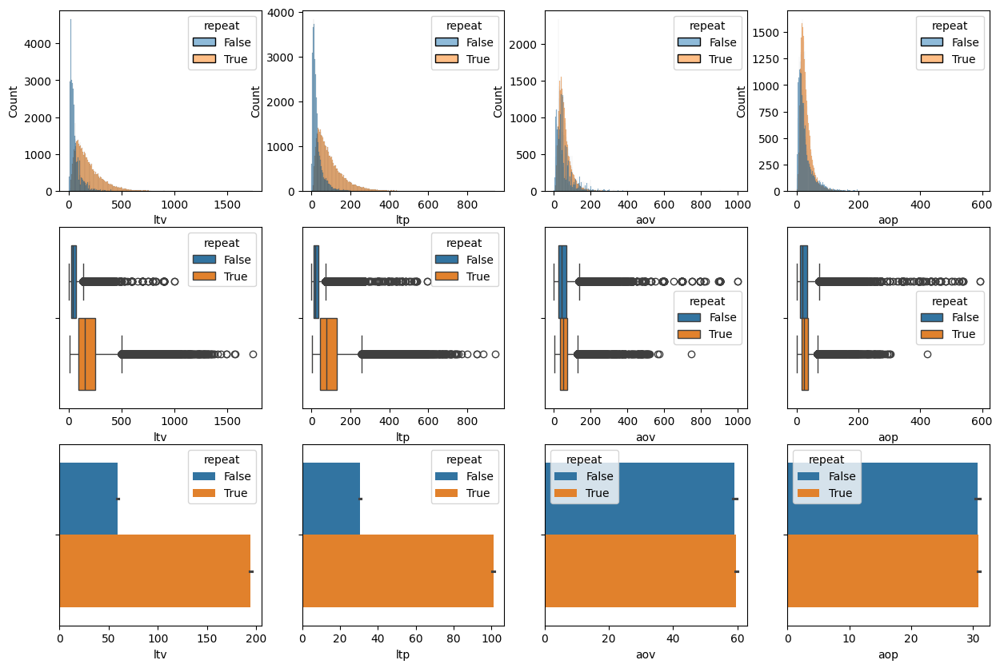

In [72]:
fig, ax = plt.subplots(3, 4, figsize=(15, 10))

for i in range(len(vals)):
    sns.histplot(data=df, x=vals[i], hue='repeat', ax=ax[0][i])
    sns.boxplot(data=df, x=vals[i], hue='repeat', ax=ax[1][i])
    sns.barplot(data=df, x=vals[i], hue='repeat', ax=ax[2][i])

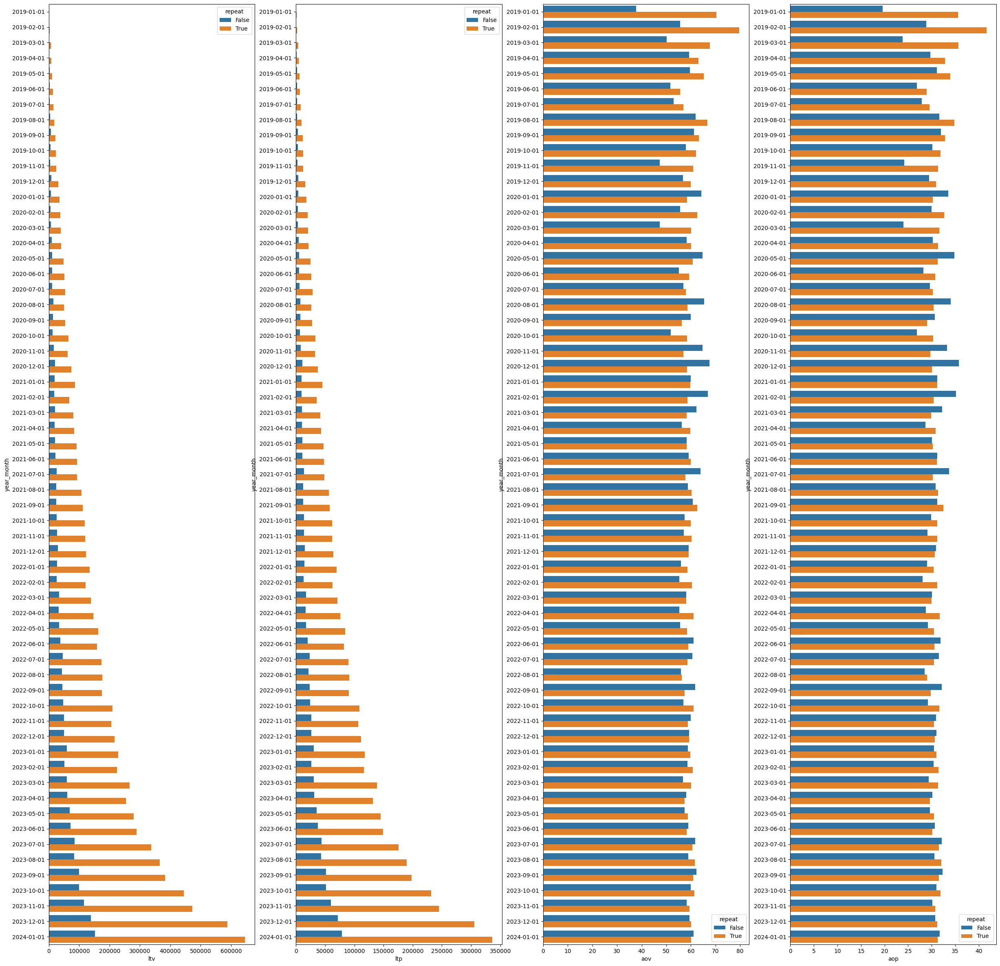

In [117]:
df = user_order_items.groupby(['repeat', 'year_month']).agg(
    ltv=('retail_price', 'sum'),
    tot_cost=('cost', 'sum'),
    tot_ords=('order_id', 'count')
).reset_index()
df['ltp'] = df['ltv'] - df['tot_cost']
df['aov'] = df['ltv'] / df['tot_ords']
df['aop'] = df['ltp'] / df['tot_ords']

fig, ax = plt.subplots(1, 4, figsize=(30, 30))
sns.barplot(data=df, x=vals[0], y='year_month', hue='repeat', ax=ax[0])
sns.barplot(data=df, x=vals[1], y='year_month', hue='repeat', ax=ax[1])
sns.barplot(data=df, x=vals[2], y='year_month', hue='repeat', ax=ax[2])
sns.barplot(data=df, x=vals[3], y='year_month', hue='repeat', ax=ax[3])
plt.show()

In [106]:
df = user_order_items.groupby([dim, 'repeat', 'year_month']).agg(
    ltv=('retail_price', 'sum'),
    tot_cost=('cost', 'sum'),
    tot_ords=('order_id', 'count')
).reset_index()
df['ltp'] = df['ltv'] - df['tot_cost']
df['aov'] = df['ltv'] / df['tot_ords']
df['aop'] = df['ltp'] / df['tot_ords']
df

,n_orders,repeat,year_month,ltv,tot_cost,tot_ords,ltp,aov,aop
0,1,False,2019-01-01,226.79,109.15,6,117.64,37.798333,19.606667
1,1,False,2019-02-01,779.16,375.55,14,403.61,55.654286,28.829286
2,1,False,2019-03-01,1054.12,553.49,21,500.63,50.196190,23.839524
3,1,False,2019-04-01,1778.84,887.73,30,891.11,59.294667,29.703667
4,1,False,2019-05-01,3338.99,1599.39,56,1739.60,59.624821,31.064286
...,...,...,...,...,...,...,...,...,...
672,13,True,2022-10-01,194.48,102.76,4,91.72,48.620000,22.930000
673,13,True,2023-02-01,84.01,42.93,4,41.08,21.002500,10.270000
674,13,True,2023-09-01,29.41,15.12,1,14.29,29.410000,14.290000
675,13,True,2023-11-01,203.89,119.35,4,84.54,50.972500,21.135000


/tmp/ipykernel_1298/1464014405.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = user_order_items.groupby([dim, 'repeat']).agg(


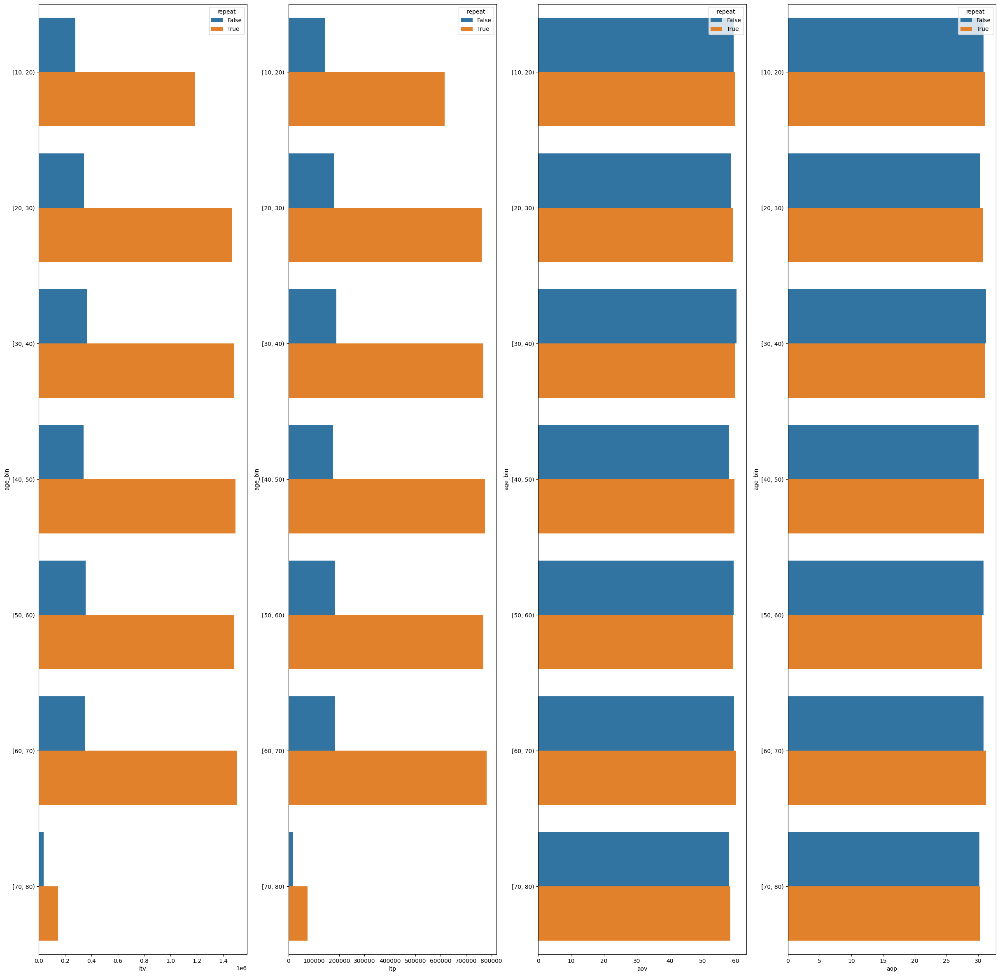

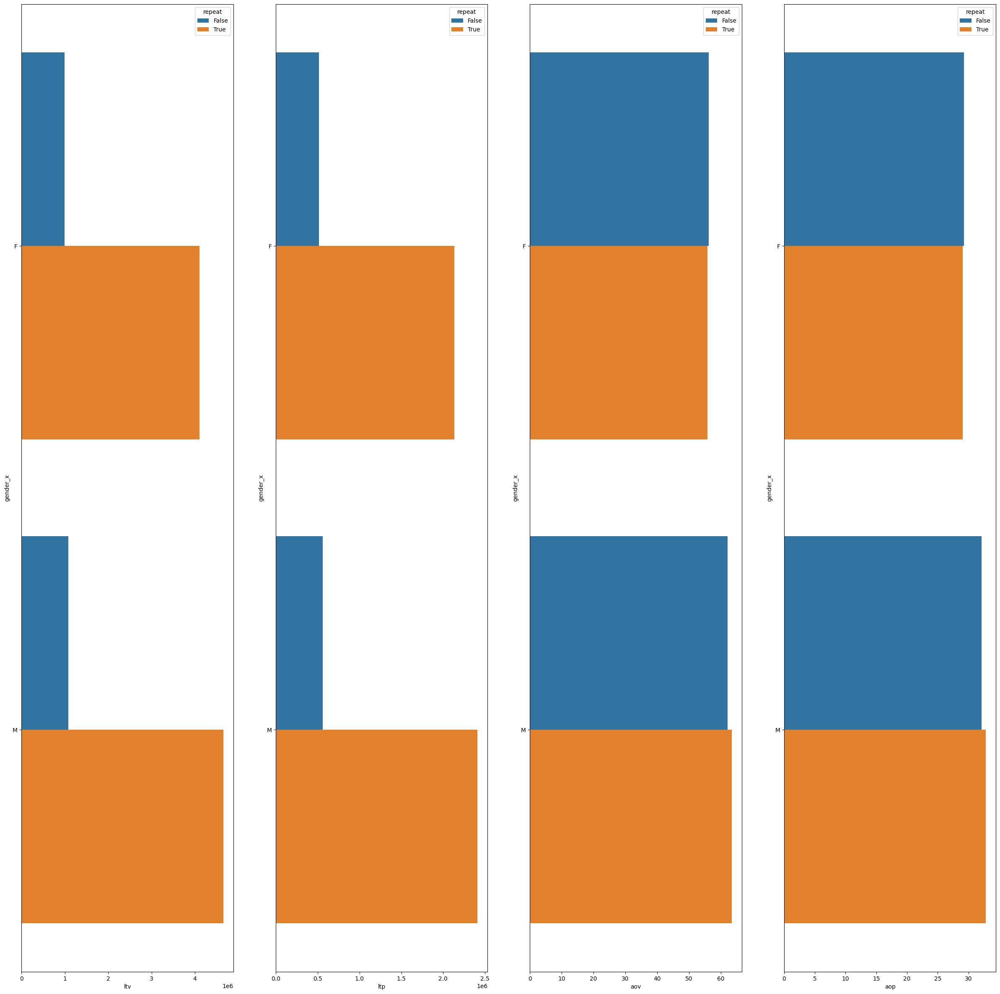

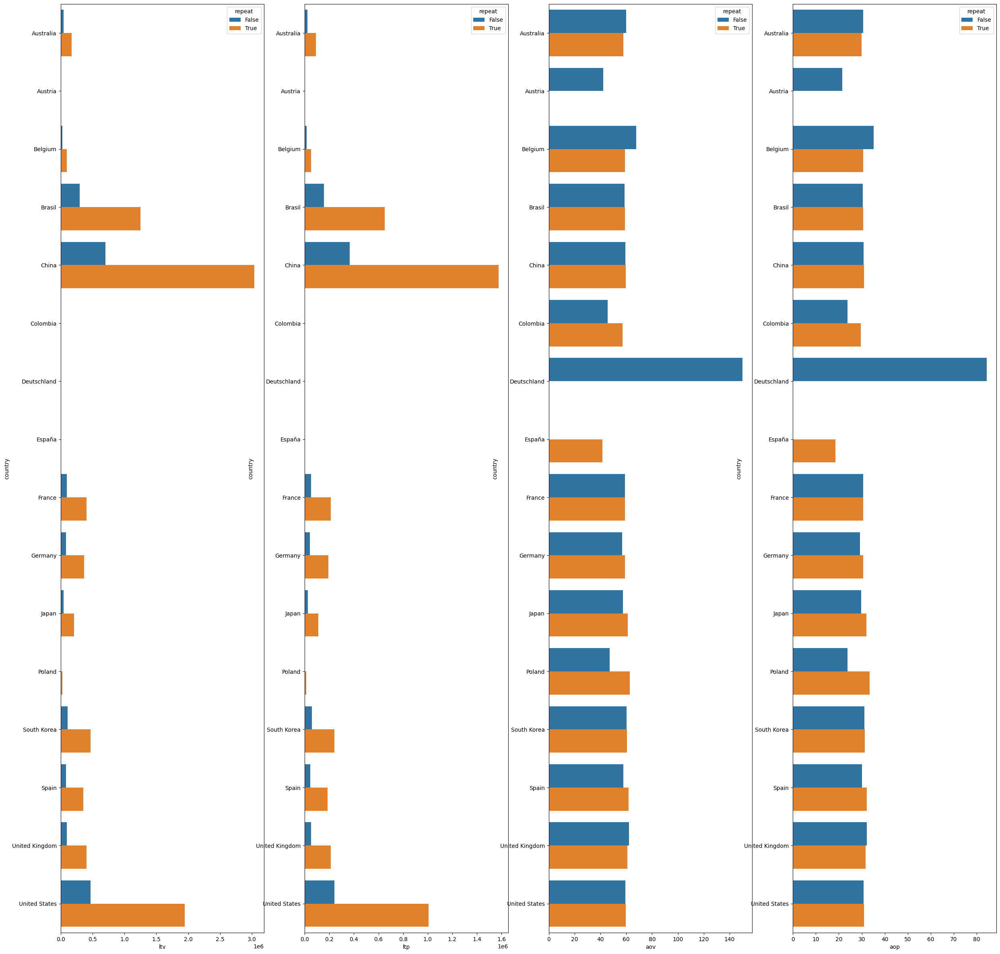

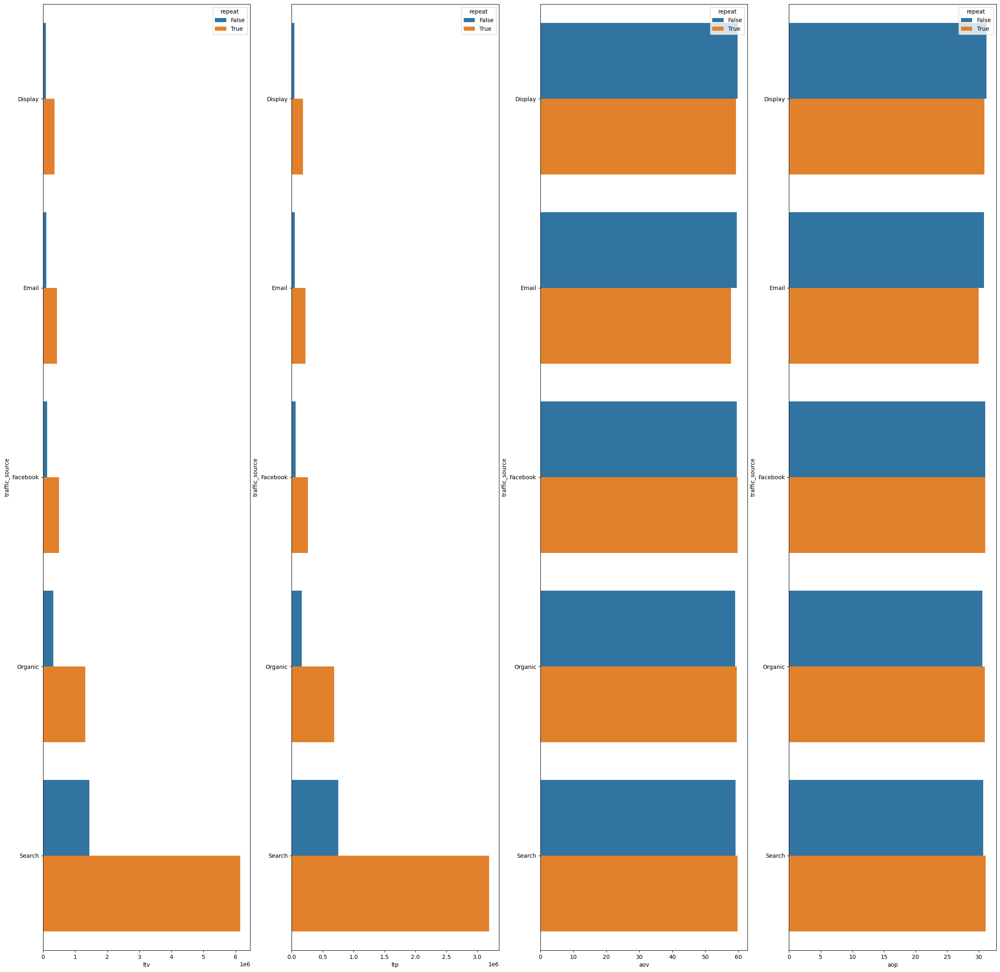

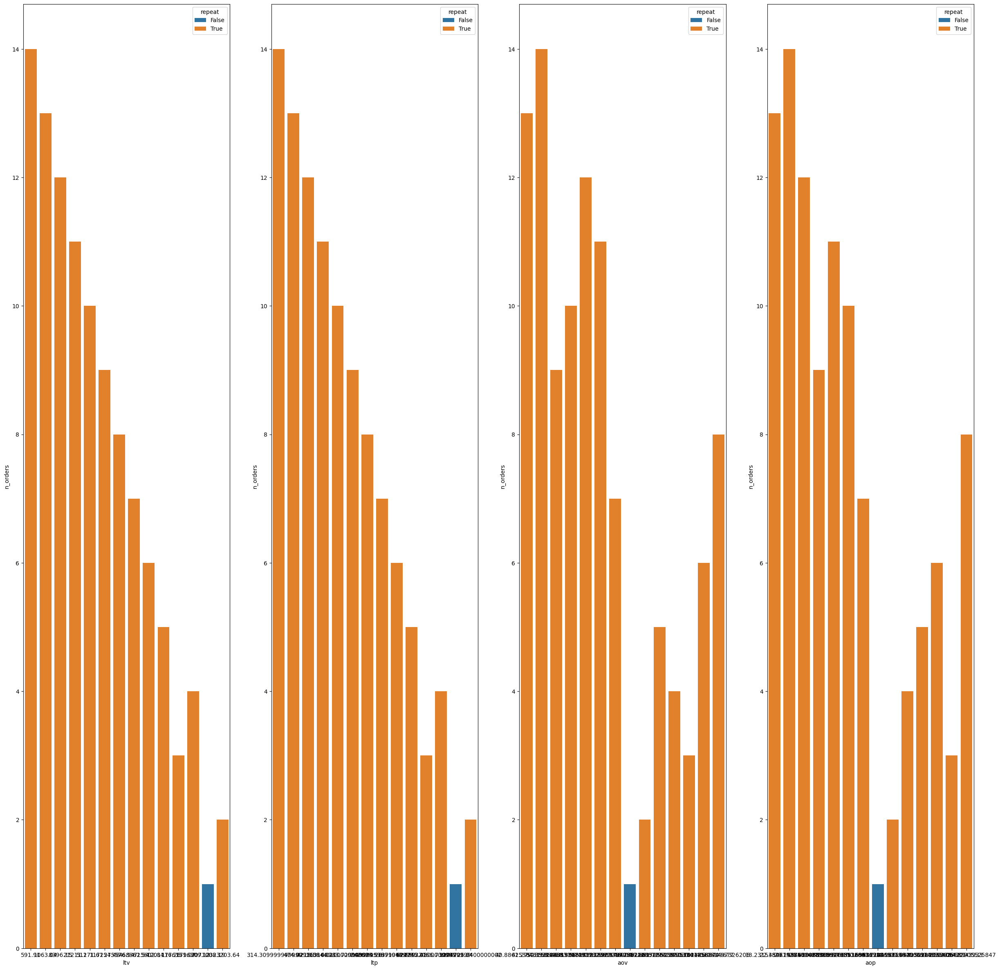

In [133]:
for dim in dims:
    df = user_order_items.groupby([dim, 'repeat']).agg(
        ltv=('retail_price', 'sum'),
        tot_cost=('cost', 'sum'),
        tot_ords=('order_id', 'count')
    ).reset_index()
    df['ltp'] = df['ltv'] - df['tot_cost']
    df['aov'] = df['ltv'] / df['tot_ords']
    df['aop'] = df['ltp'] / df['tot_ords']

    # iterate through all the year_month values
    fig, ax = plt.subplots(1, 4, figsize=(30, 30))        
    sns.barplot(data=df, x=vals[0], y=dim, hue='repeat', ax=ax[0])
    sns.barplot(data=df, x=vals[1], y=dim, hue='repeat', ax=ax[1])
    sns.barplot(data=df, x=vals[2], y=dim, hue='repeat', ax=ax[2])
    sns.barplot(data=df, x=vals[3], y=dim, hue='repeat', ax=ax[3])
    plt.show()

/tmp/ipykernel_1298/1934291568.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = user_order_items.groupby([dim, 'repeat', 'year_month']).agg(


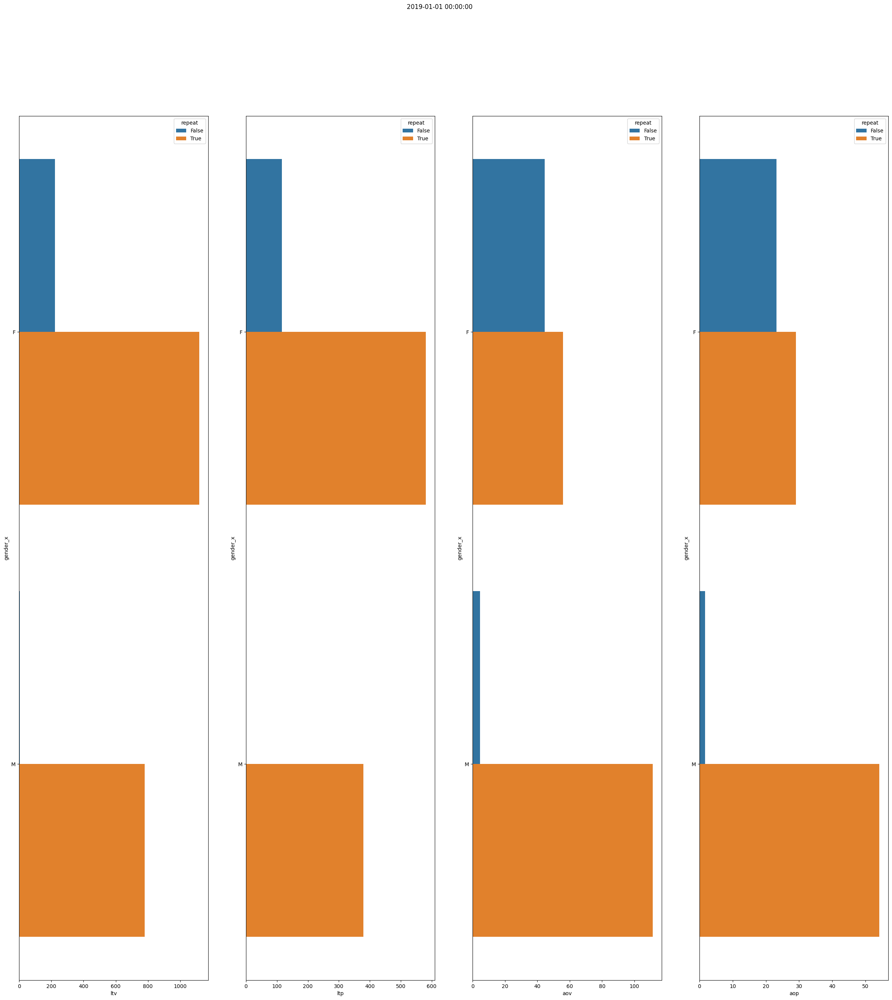

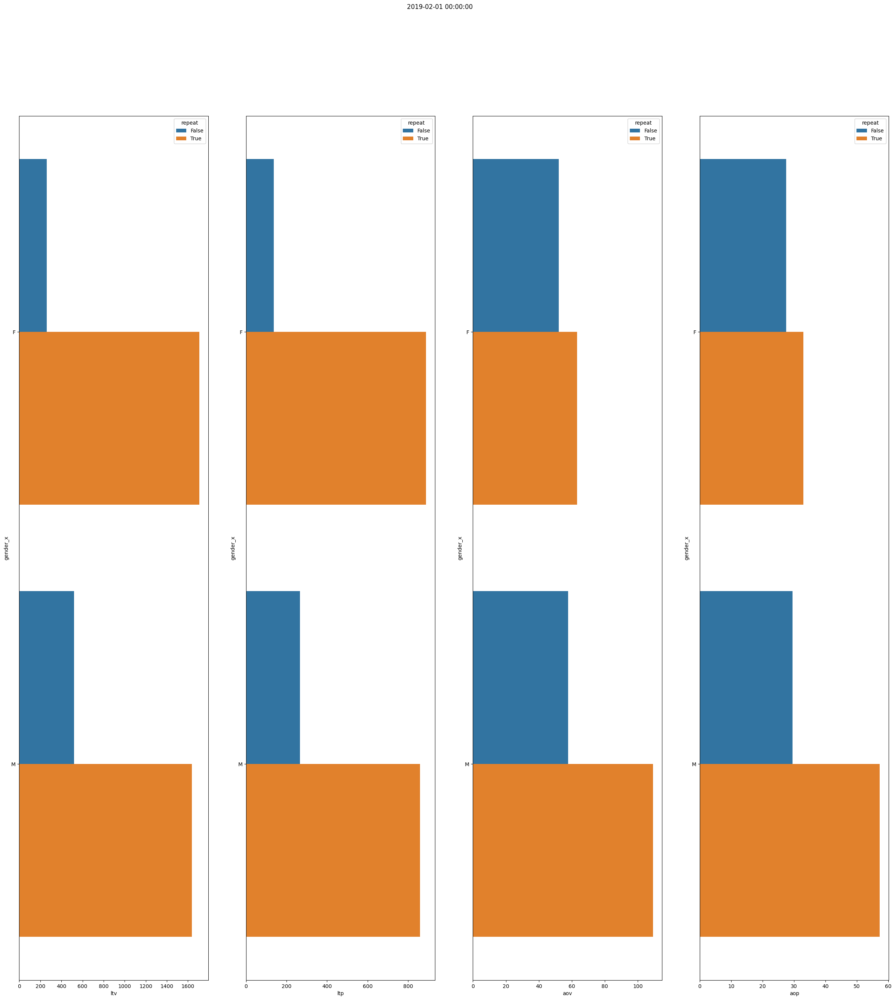

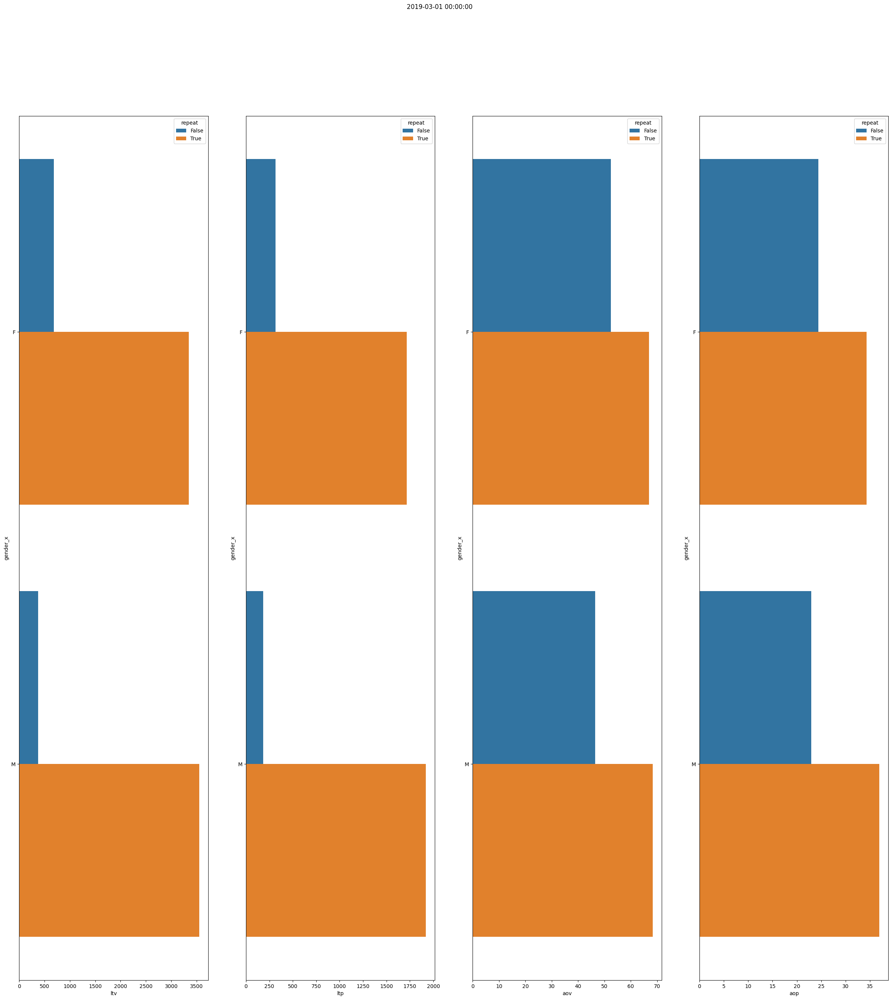

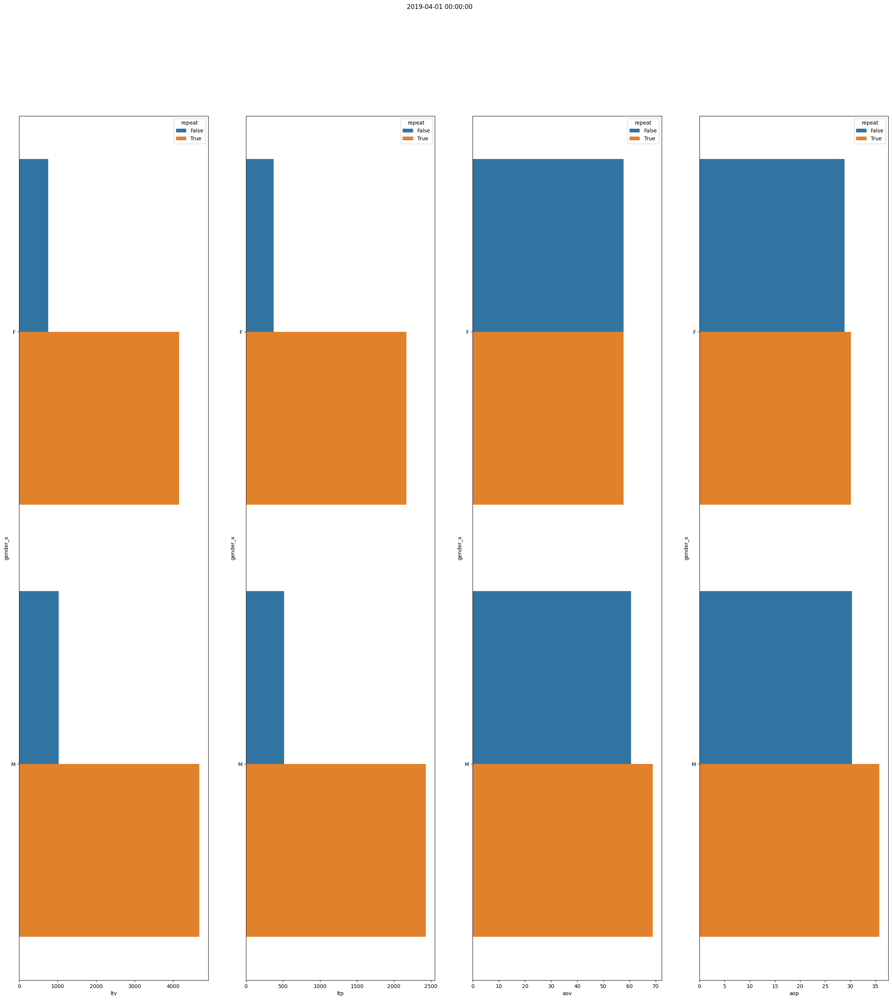

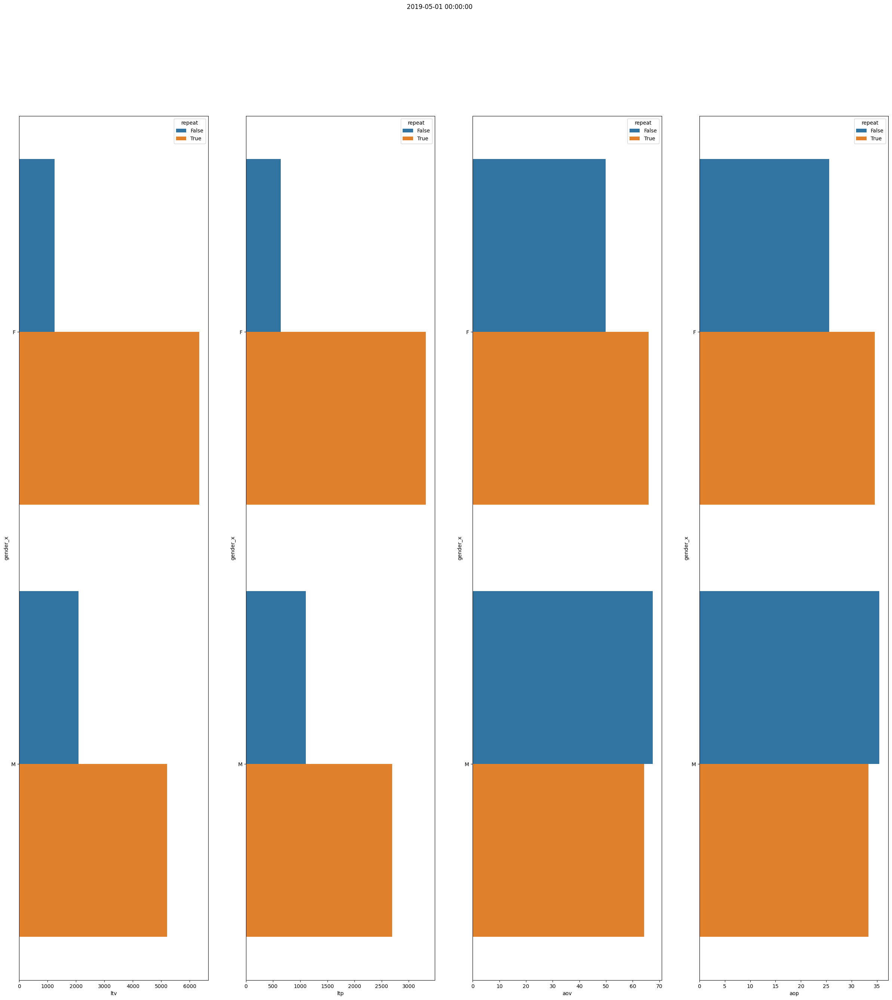

...

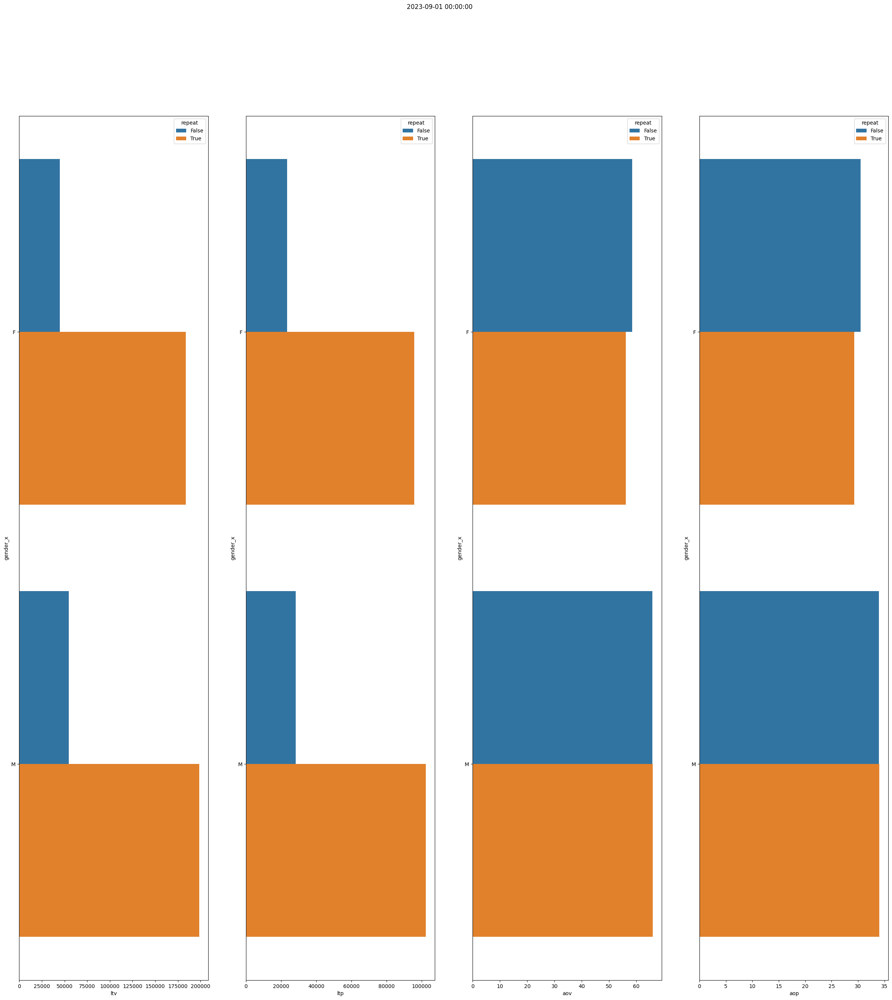

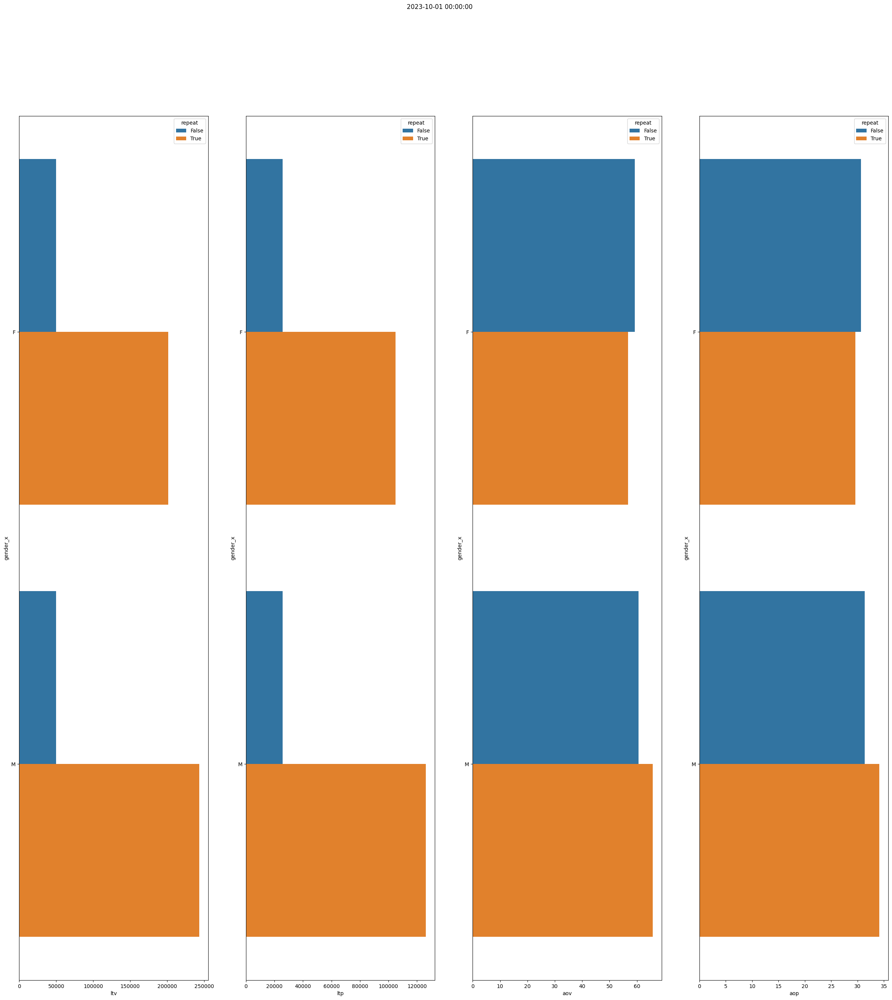

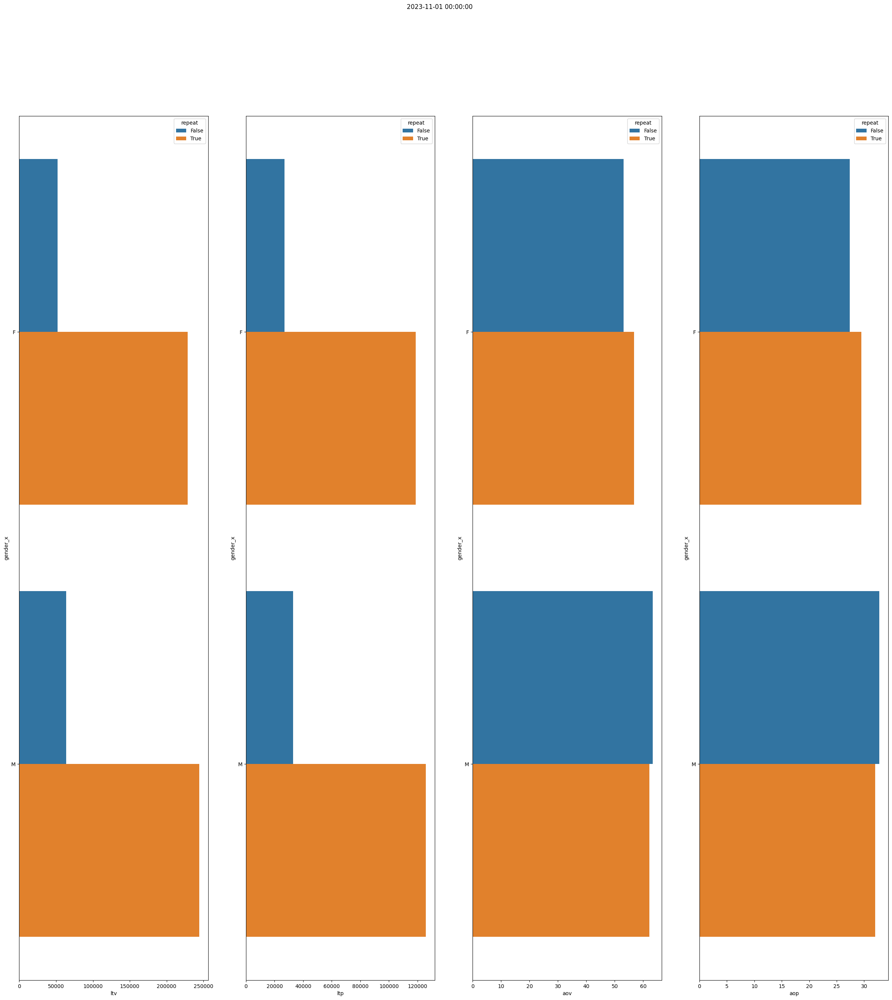

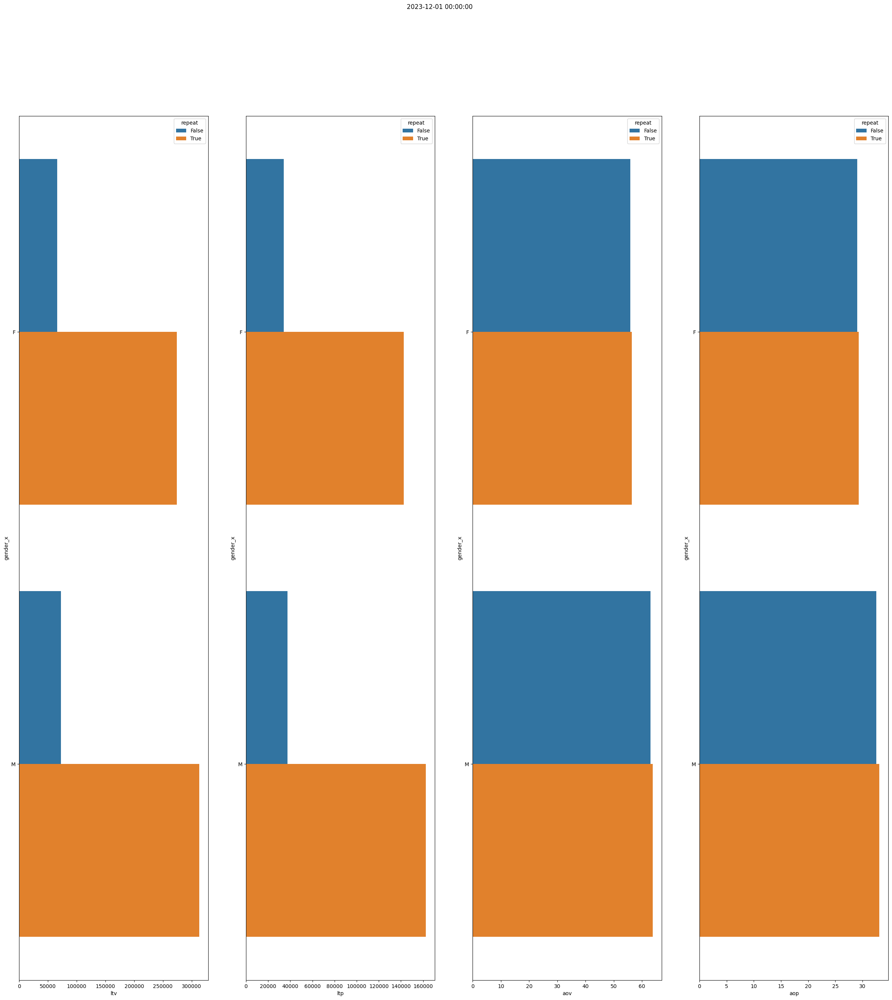

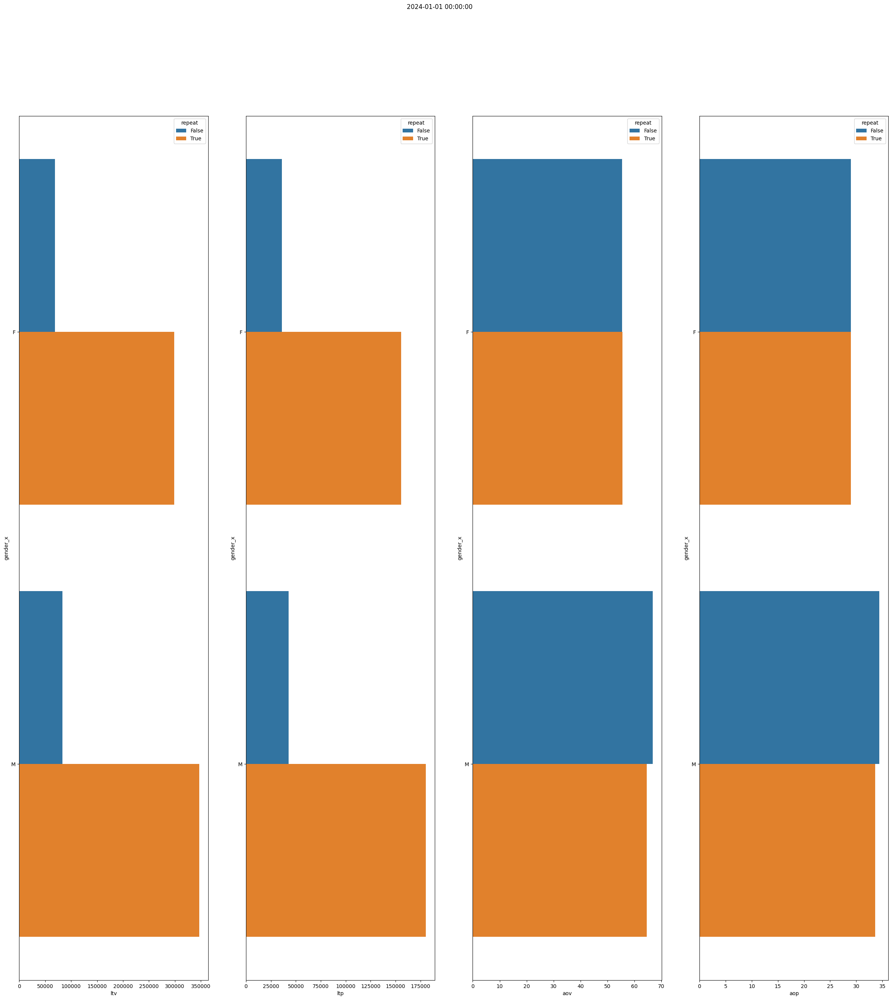

In [135]:
for dim in dims:
    df = user_order_items.groupby([dim, 'repeat', 'year_month']).agg(
        ltv=('retail_price', 'sum'),
        tot_cost=('cost', 'sum'),
        tot_ords=('order_id', 'count')
    ).reset_index()
    df['ltp'] = df['ltv'] - df['tot_cost']
    df['aov'] = df['ltv'] / df['tot_ords']
    df['aop'] = df['ltp'] / df['tot_ords']
    if dim != 'gender_x':
        continue
    # iterate through all the year_month values
    for year_month in df['year_month'].unique():
        ym_df = df[df['year_month'] == year_month]
        fig, ax = plt.subplots(1, 4, figsize=(30, 30))        
        fig.suptitle(str(year_month))
        sns.barplot(data=ym_df, x=vals[0], y=dim, hue='repeat', ax=ax[0])
        sns.barplot(data=ym_df, x=vals[1], y=dim, hue='repeat', ax=ax[1])
        sns.barplot(data=ym_df, x=vals[2], y=dim, hue='repeat', ax=ax[2])
        sns.barplot(data=ym_df, x=vals[3], y=dim, hue='repeat', ax=ax[3])
        plt.show()

In [89]:
df

,year_month,repeat,ltv,tot_cost,n_orders,ltp,aov,aop
0,2019-01-01,False,226.79,109.15,6,117.64,37.798333,19.606667
1,2019-01-01,True,1898.29,937.43,27,960.86,70.307037,35.587407
2,2019-02-01,False,779.16,375.55,14,403.61,55.654286,28.829286
3,2019-02-01,True,3345.85,1597.19,42,1748.66,79.663095,41.634762
4,2019-03-01,False,1054.12,553.49,21,500.63,50.196190,23.839524
...,...,...,...,...,...,...,...,...
117,2023-11-01,True,472758.33,228170.04,7952,244588.29,59.451500,30.758085
118,2023-12-01,False,138720.98,66838.60,2335,71882.38,59.409413,30.784745
119,2023-12-01,True,587618.03,282419.55,9777,305198.48,60.102079,31.215964
120,2024-01-01,False,151879.75,73110.76,2483,78768.99,61.167841,31.723315


<Axes: xlabel='aop', ylabel='year_month'>

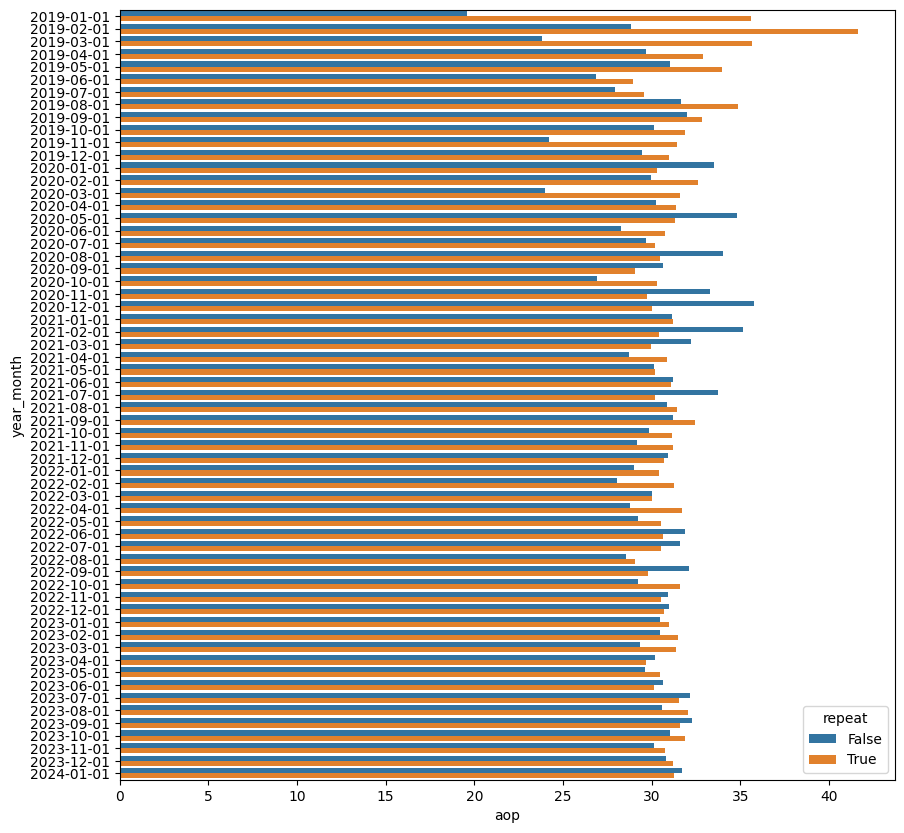

In [93]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.barplot(df, y='year_month', x='aop', hue='repeat')

In [73]:
# visualise by the rest of the dimensions to make sure average isn't hiding anything
for dim in dims:
    df = user_order_items.groupby([dim, 'repeat']

['year_month', 'age', 'gender_x', 'country', 'traffic_source', 'n_orders']

In [ ]:

df = user_order_items.groupby(['id_x').agg(
    ltv=('retail_price', 'sum'),
    tot_cost=('cost', 'sum'),
    n_orders=('order_id', 'count')
)
df['ltp'] = df['ltv'] - df['tot_cost']
df['aov'] = df['ltv'] / df['n_orders']
df['aop'] = df['ltp'] / df['n_orders']
df['repeat'] = df['n_orders'] > 1
df

<Axes: xlabel='aop'>

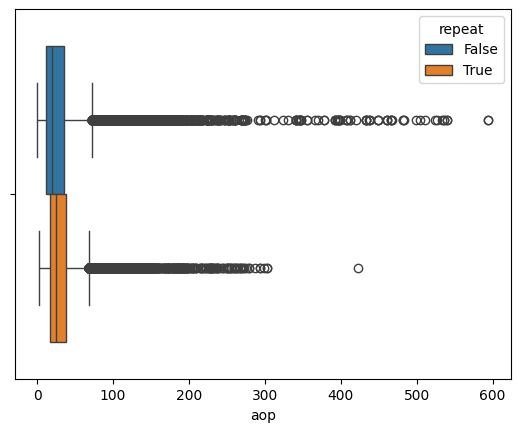

In [37]:
sns.boxplot(data=df, x='aop', hue='repeat')

# Initial Data Analysis

## Customer Growth / CRM

### How have retention and repeat purchase patterns changed over the last 24–36 months, segmented by acquisition channel, demographics (age/gender), and location?
Metrics of interest: Retention and repeat purchase patterns
Retention
- User engagement
- Repeated purchases

Repeat purchase patterns (by Y-M)
- Number of repeated orders (-> see if something is driving the growth more than others)
- Number of repeated orders / number of total orders
- Average number of items per order
- Average revenue per order
- Average profit per order



User engagement (Retention focused)
- Percentage of users who have sessions daily/weekly within the month.


Dimensions of interest
- Acquisition channel
- browser for user engagement
- Age
- Gender
- Location



Things to do
- Compare repeated purchase values compared to non repeated orders vs first time orders.

In [38]:
# I want to have grouped order information joined onto user information
order_itms = orders.merge(order_items, on='order_id')
order_itms = order_itms.merge(products, left_on='product_id', right_on='product_id')

# only keep rows from non-first orders

multiple_order_itms = order_itms.sort_values(by=['user_id_x', 'created_at_x'])
multiple_order_itms['order_number'] = multiple_order_itms.groupby('user_id_x')['created_at_x'].rank(method='dense').astype(int)
repeated_order_itms = multiple_order_itms[multiple_order_itms['order_number'] > 1].copy()

# now group by order

repeated_orders_agg = repeated_order_itms.groupby(['user_id_x', 'order_id', 'created_at_x']).agg(
    n_items=('order_id', 'count'),
    tot_rev=('retail_price', 'sum'),
    tot_cost=('cost', 'sum')
).reset_index()

# now join on users
repeated_user_orders = repeated_orders_agg.merge(users, left_on='user_id_x', right_on='user_id')
repeated_user_orders = repeated_user_orders.rename(columns={'user_id_x': 'user_id', 'created_at_x': 'order_date'})
repeated_user_orders['year_month'] = repeated_user_orders['order_date'].dt.to_period('M').dt.to_timestamp()
repeated_user_orders['age_bin'] = pd.cut(
    repeated_user_orders['age'],
    bins=range(10, 81, 10),
    right=False
)
repeated_user_orders['user_id'].value_counts()

,user_id,order_id,order_date,n_items,tot_rev,tot_cost,user_id,first_name,last_name,email,...,street_address,postal_code,city,country,latitude,longitude,traffic_source,created_at,year_month,age_bin
0,3,3,2023-04-23 09:13:00,1,59.99,30.17,3,Clifford,Guzman,cliffordguzman@example.org,...,3197 Richard Via,33009,Hallandale Beach,United States,25.985238,-80.146620,Organic,2023-03-09 09:13:00,2023-04-01,"[10, 20)"
1,3,4,2023-08-08 09:13:00,1,108.75,47.31,3,Clifford,Guzman,cliffordguzman@example.org,...,3197 Richard Via,33009,Hallandale Beach,United States,25.985238,-80.146620,Organic,2023-03-09 09:13:00,2023-08-01,"[10, 20)"
2,3,6,2023-04-02 09:13:00,2,123.47,69.55,3,Clifford,Guzman,cliffordguzman@example.org,...,3197 Richard Via,33009,Hallandale Beach,United States,25.985238,-80.146620,Organic,2023-03-09 09:13:00,2023-04-01,"[10, 20)"
3,9,12,2023-11-02 17:44:00,2,71.95,41.21,9,Jason,Payne,jasonpayne@example.com,...,63281 Bradley Village,730031,Xiamen,China,36.054103,103.810039,Organic,2019-08-09 17:44:00,2023-11-01,"[30, 40)"
4,11,14,2024-01-11 09:06:00,1,132.00,57.82,11,Victoria,Fuller,victoriafuller@example.org,...,87971 Beverly Mission Apt. 051,38405,Uberlândia,Brasil,-18.899042,-48.257441,Organic,2023-07-15 09:06:00,2024-01-01,"[40, 50)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44123,99983,125211,2023-08-25 15:06:00,1,12.99,6.22,99983,Geoffrey,Williams,geoffreywilliams@example.org,...,400 Stacy Curve,101509,Shanghai,China,40.351331,116.792066,Search,2022-02-27 15:06:00,2023-08-01,"[40, 50)"
44124,99996,125220,2023-03-13 02:00:00,2,62.87,30.75,99996,Robert,Murphy,robertmurphy@example.net,...,87464 Kathryn Islands Suite 457,522021,Nanping,China,23.514312,116.411514,Search,2019-12-30 02:00:00,2023-03-01,"[50, 60)"
44125,99998,125222,2023-01-28 07:27:00,1,55.00,28.93,99998,David,Tran,davidtran@example.org,...,3759 Mullins Well Suite 754,28715,Candler,United States,35.512934,-82.716829,Search,2022-10-31 07:27:00,2023-01-01,"[50, 60)"
44126,99998,125223,2023-07-22 07:27:00,1,21.99,10.03,99998,David,Tran,davidtran@example.org,...,3759 Mullins Well Suite 754,28715,Candler,United States,35.512934,-82.716829,Search,2022-10-31 07:27:00,2023-07-01,"[50, 60)"


In [ ]:
repeated_user_orders['n_items'] > 

In [5]:
repeated_user_orders.columns

Index(['user_id', 'order_id', 'order_date', 'n_items', 'tot_rev', 'tot_cost',
       'id', 'first_name', 'last_name', 'email', 'age', 'gender', 'state',
       'street_address', 'postal_code', 'city', 'country', 'latitude',
       'longitude', 'traffic_source', 'created_at', 'year_month', 'age_bin'],
      dtype='object')

In [39]:
# year mont aggregate
repeated_user_orders_agg = repeated_user_orders.groupby(['year_month', 'age', 'gender', 'country', 'traffic_source']).agg(
    tot_orders=('order_id', 'count')
).reset_index()

In [40]:
repeated_user_orders_agg

,year_month,age,gender,country,traffic_source,tot_orders
0,2019-02-01,26,F,China,Search,1
1,2019-03-01,23,F,China,Display,1
2,2019-04-01,32,F,France,Search,1
3,2019-05-01,19,M,Japan,Search,1
4,2019-05-01,53,M,South Korea,Facebook,1
...,...,...,...,...,...,...
27105,2024-01-01,70,M,France,Search,1
27106,2024-01-01,70,M,Germany,Facebook,1
27107,2024-01-01,70,M,South Korea,Organic,1
27108,2024-01-01,70,M,United States,Organic,1


In [ ]:
repeated_user_orders_agg

In [8]:
v = ['age_bin', 'gender', 'country', 'traffic_source']

## Visualisation

In [82]:
user_orders = users.merge(orders.merge(order_items, on='order_id'), left_on='id', right_on='order_id')

user_orders['year_month'] = user_orders['created_at_x'].dt.to_period('M').dt.to_timestamp()

<Axes: xlabel='year_month', ylabel='Count'>

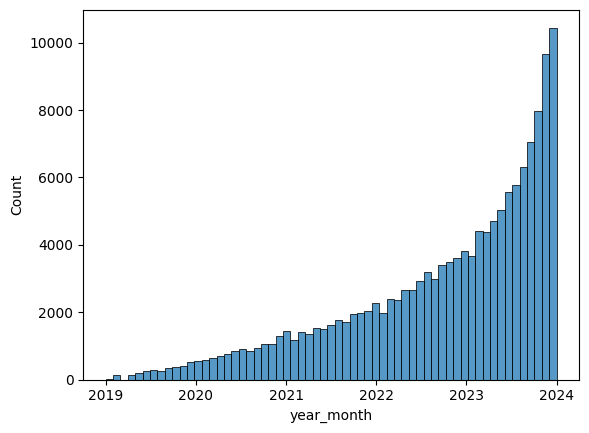

In [86]:
sns.histplot(data=user_orders, x='year_month', bins=61)

<Axes: xlabel='year_month', ylabel='Count'>

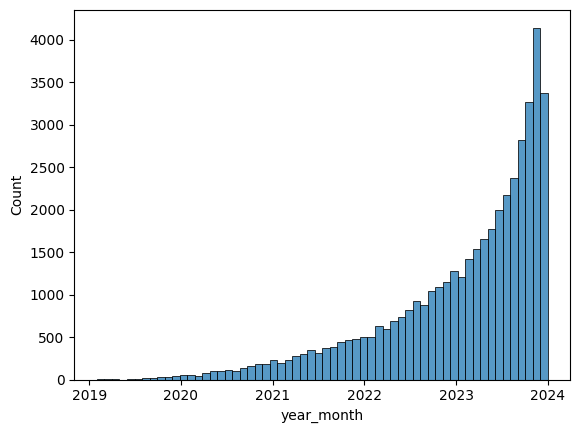

In [9]:
sns.histplot(data=repeated_user_orders, x='year_month', bins=60)

<Axes: xlabel='year_month', ylabel='Count'>

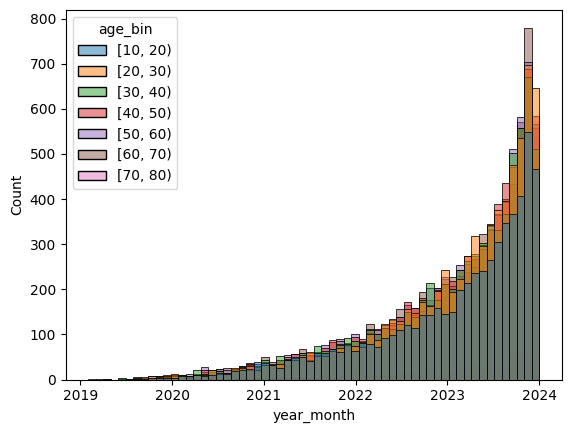

In [10]:
sns.histplot(data=repeated_user_orders, x='year_month', bins=60, hue=v[0])

<Axes: xlabel='age', ylabel='year_month'>

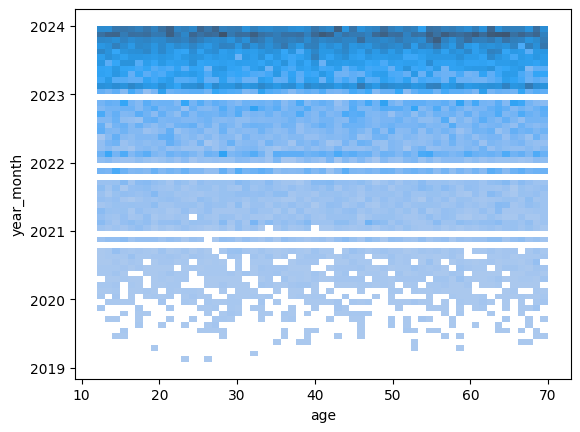

In [11]:
sns.histplot(data=repeated_user_orders, x = 'age',y='year_month', bins=59)

/tmp/ipykernel_4699/211150662.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  time_age_props = repeated_user_orders.groupby(['age_bin', 'year_month']).agg(
/tmp/ipykernel_4699/211150662.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tot_age_props = time_age_props[['age_bin', 'tot_orders', 'tot_items']].groupby('age_bin').sum().reset_index()


<Axes: xlabel='tot_item_prop', ylabel='age_bin'>

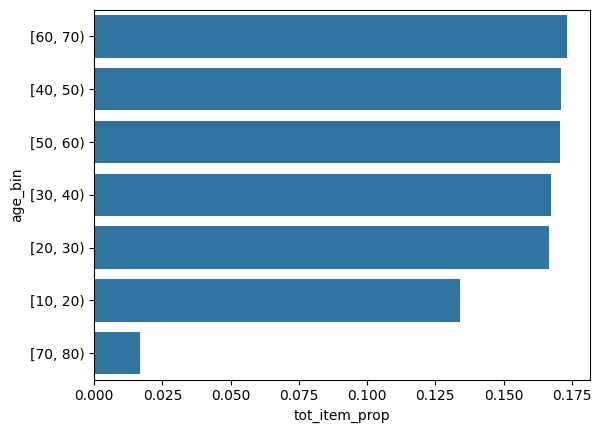

In [12]:
# total order country proportions
time_age_props = repeated_user_orders.groupby(['age_bin', 'year_month']).agg(
    tot_orders=('order_id', 'count'),
    tot_items=('n_items', 'sum'),
).reset_index()

time_age_props['total_orders_month'] = time_age_props.groupby('year_month')['tot_orders'].transform('sum')
time_age_props['total_items_month'] = time_age_props.groupby('year_month')['tot_items'].transform('sum')

time_age_props['prop_orders'] = time_age_props['tot_orders'] / time_age_props['total_orders_month']
time_age_props['prop_items']  = time_age_props['tot_items'] / time_age_props['total_items_month']


tot_age_props = time_age_props[['age_bin', 'tot_orders', 'tot_items']].groupby('age_bin').sum().reset_index()

tot_age_props['tot_order_prop'] = tot_age_props['tot_orders'] / tot_age_props['tot_orders'].sum()
tot_age_props['tot_item_prop'] = tot_age_props['tot_items'] / tot_age_props['tot_items'].sum()

sns.barplot(data=tot_age_props, x='tot_item_prop', y='age_bin', order=tot_age_props.sort_values('tot_item_prop', ascending=False)['age_bin'].values)

<Axes: xlabel='tot_order_prop', ylabel='age_bin'>

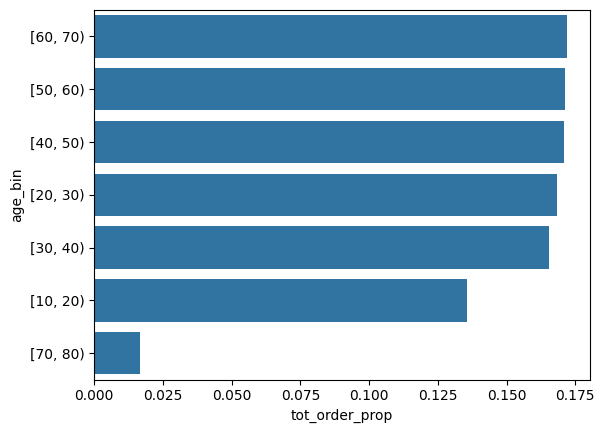

In [13]:
sns.barplot(data=tot_age_props, x='tot_order_prop', y='age_bin', order=tot_age_props.sort_values('tot_order_prop', ascending=False)['age_bin'].values)

In [14]:
time_age_props

,age_bin,year_month,tot_orders,tot_items,total_orders_month,total_items_month,prop_orders,prop_items
0,"[10, 20)",2019-02-01,0,0,1,1,0.000000,0.000000
1,"[10, 20)",2019-03-01,0,0,1,1,0.000000,0.000000
2,"[10, 20)",2019-04-01,0,0,1,1,0.000000,0.000000
3,"[10, 20)",2019-05-01,1,2,3,4,0.333333,0.500000
4,"[10, 20)",2019-06-01,0,0,6,9,0.000000,0.000000
...,...,...,...,...,...,...,...,...
415,"[70, 80)",2023-09-01,40,64,2379,3501,0.016814,0.018280
416,"[70, 80)",2023-10-01,63,94,2825,4091,0.022301,0.022977
417,"[70, 80)",2023-11-01,60,90,3267,4783,0.018365,0.018817
418,"[70, 80)",2023-12-01,56,64,4144,6003,0.013514,0.010661


<Axes: xlabel='year_month', ylabel='prop_orders'>

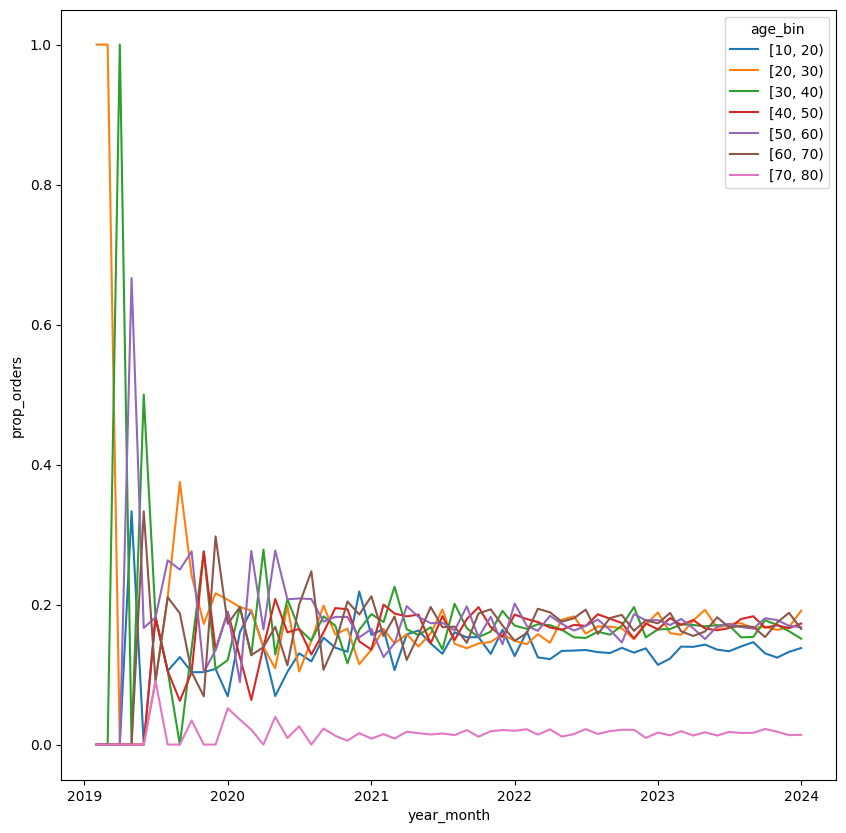

In [15]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.lineplot(data=time_age_props, x='year_month', y='prop_orders', hue='age_bin', ax=ax)

In [16]:
last_month_props = time_age_props[time_age_props['year_month'] == '2024-01-01 00:00:00']

In [17]:
tot_age_props['tot_order_prop'].values - last_month_props['prop_orders'].values

array([-0.00248191, -0.02302223,  0.01424555, -0.0018355 ,  0.00383301,
        0.00660918,  0.00265189])

<Axes: xlabel='year_month', ylabel='Count'>

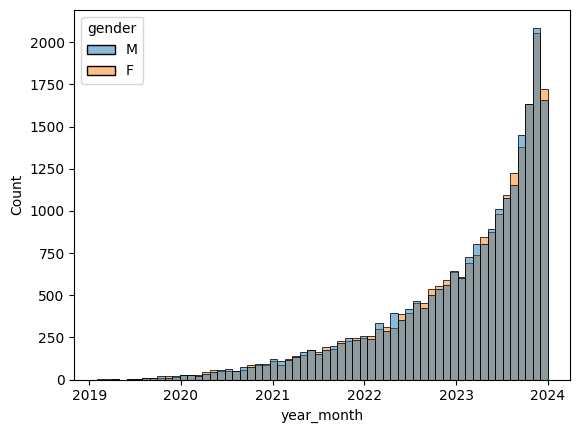

In [18]:
sns.histplot(data=repeated_user_orders, x='year_month', bins=60, hue=v[1])

<Axes: xlabel='year_month', ylabel='Count'>

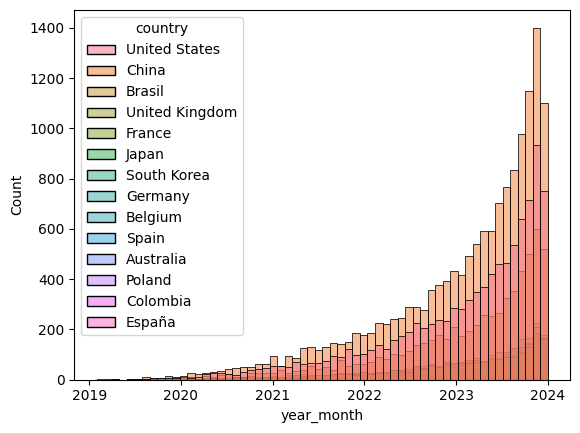

In [19]:
sns.histplot(data=repeated_user_orders, x='year_month', bins=60, hue=v[2])

<Axes: xlabel='tot_item_prop', ylabel='country'>

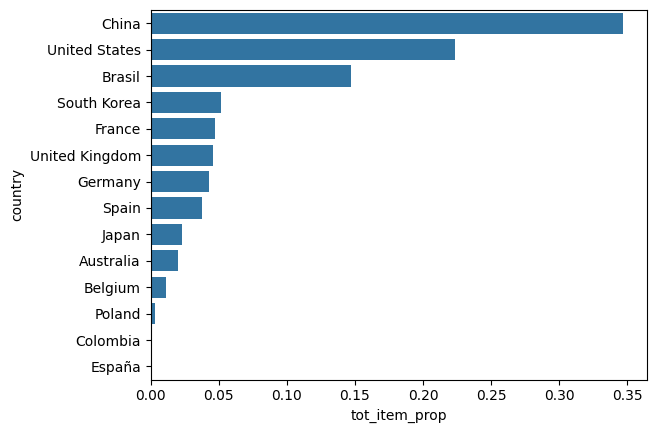

In [20]:
# total order country proportions
time_country_props = repeated_user_orders.groupby(['country', 'year_month']).agg(
    tot_orders=('order_id', 'count'),
    tot_items=('n_items', 'sum'),
).reset_index()

time_country_props['total_orders_month'] = time_country_props.groupby('year_month')['tot_orders'].transform('sum')
time_country_props['total_items_month'] = time_country_props.groupby('year_month')['tot_items'].transform('sum')

time_country_props['prop_orders'] = time_country_props['tot_orders'] / time_country_props['total_orders_month']
time_country_props['prop_items']  = time_country_props['tot_items'] / time_country_props['total_items_month']


tot_country_props = time_country_props[['country', 'tot_orders', 'tot_items']].groupby('country').sum().reset_index()

tot_country_props['tot_order_prop'] = tot_country_props['tot_orders'] / tot_country_props['tot_orders'].sum()
tot_country_props['tot_item_prop'] = tot_country_props['tot_items'] / tot_country_props['tot_items'].sum()

sns.barplot(data=tot_country_props, x='tot_item_prop', y='country', order=tot_country_props.sort_values('tot_item_prop', ascending=False)['country'].values)

<Axes: xlabel='tot_order_prop', ylabel='country'>

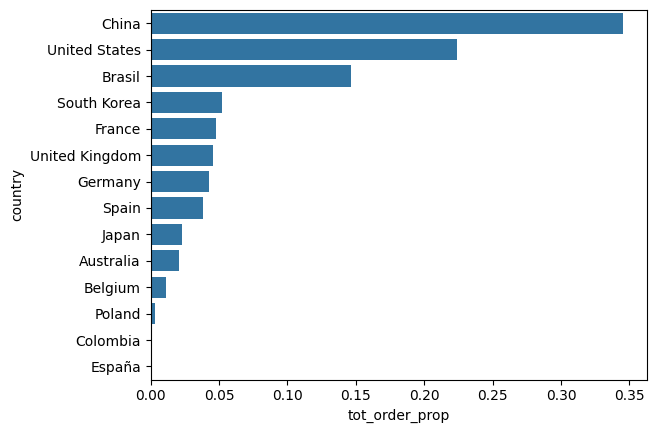

In [21]:
sns.barplot(data=tot_country_props, x='tot_order_prop', y='country', order=tot_country_props.sort_values('tot_order_prop', ascending=False)['country'].values)

<Axes: xlabel='year_month', ylabel='prop_orders'>

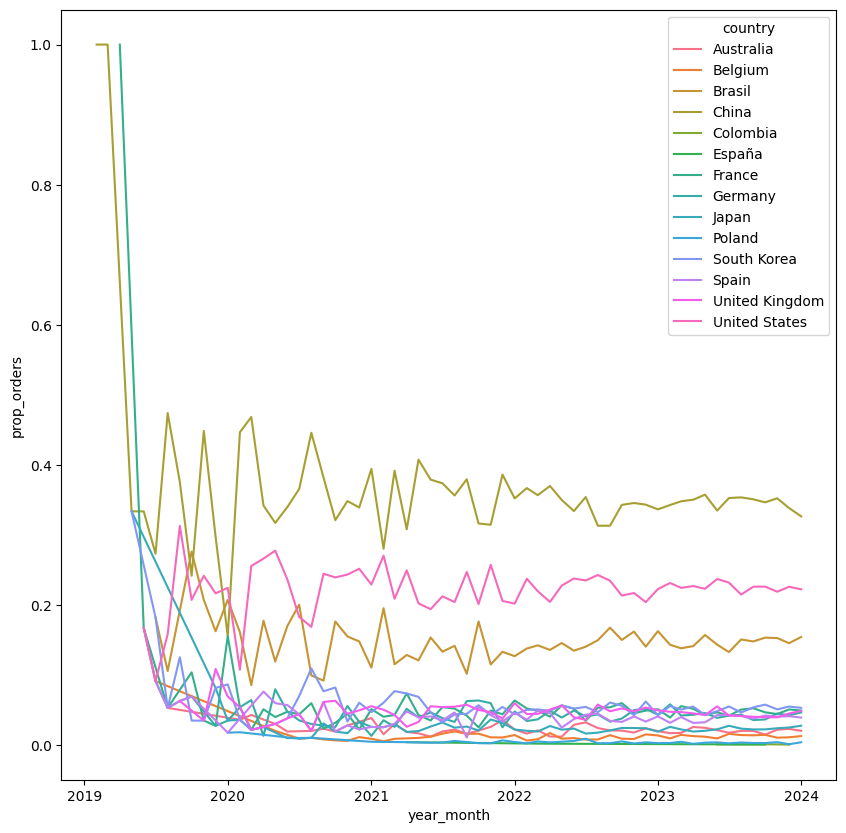

In [22]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.lineplot(data=time_country_props, x='year_month', y='prop_orders', hue='country', ax=ax)

In [23]:
last_month_props = time_country_props[time_country_props['year_month'] == '2024-01-01 00:00:00']

In [24]:
tot_country_props[tot_country_props['country'].isin(['Australia', 'Belgium', 'Brasil', 'China', 'France', 'Germany',
       'Japan', 'Poland', 'South Korea', 'Spain', 'United Kingdom',
       'United States'])]['tot_order_prop'].values - last_month_props['prop_orders'].values

array([ 0.00060632, -0.00089877, -0.00754493,  0.0190851 , -0.00096204,
       -0.00378179, -0.00414314, -0.00062908, -0.00064078, -0.00025605,
       -0.00293071,  0.00189192])

<Axes: xlabel='year_month', ylabel='Count'>

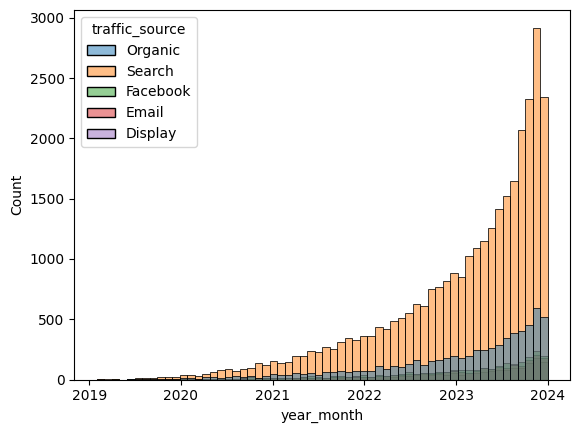

In [25]:
sns.histplot(data=repeated_user_orders, x='year_month', bins=60, hue=v[3])

<Axes: xlabel='tot_item_prop', ylabel='traffic_source'>

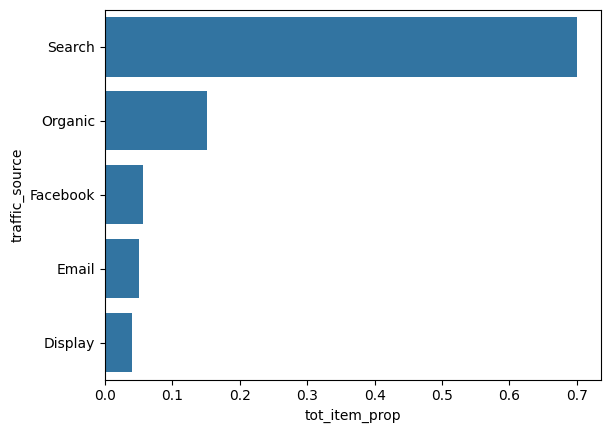

In [26]:
# total order country proportions
time_channel_props = repeated_user_orders.groupby(['traffic_source', 'year_month']).agg(
    tot_orders=('order_id', 'count'),
    tot_items=('n_items', 'sum'),
).reset_index()

time_channel_props['total_orders_month'] = time_channel_props.groupby('year_month')['tot_orders'].transform('sum')
time_channel_props['total_items_month'] = time_channel_props.groupby('year_month')['tot_items'].transform('sum')

time_channel_props['prop_orders'] = time_channel_props['tot_orders'] / time_channel_props['total_orders_month']
time_channel_props['prop_items']  = time_channel_props['tot_items'] / time_channel_props['total_items_month']


tot_channel_props = time_channel_props[['traffic_source', 'tot_orders', 'tot_items']].groupby('traffic_source').sum().reset_index()

tot_channel_props['tot_order_prop'] = tot_channel_props['tot_orders'] / tot_channel_props['tot_orders'].sum()
tot_channel_props['tot_item_prop'] = tot_channel_props['tot_items'] / tot_channel_props['tot_items'].sum()

sns.barplot(data=tot_channel_props, x='tot_item_prop', y='traffic_source', order=tot_channel_props.sort_values('tot_item_prop', ascending=False)['traffic_source'].values)

<Axes: xlabel='tot_order_prop', ylabel='traffic_source'>

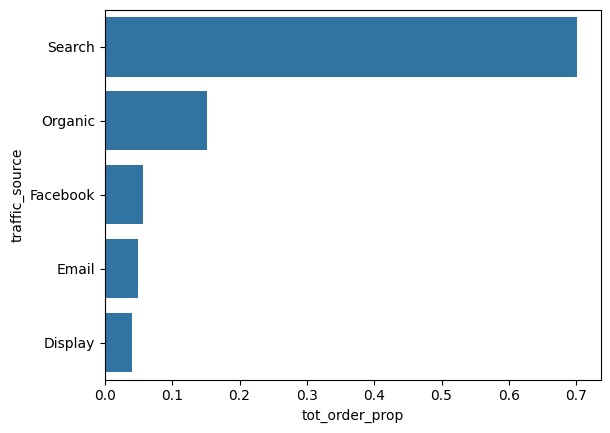

In [27]:
sns.barplot(data=tot_channel_props, x='tot_order_prop', y='traffic_source', order=tot_channel_props.sort_values('tot_order_prop', ascending=False)['traffic_source'].values)

<Axes: xlabel='year_month', ylabel='prop_orders'>

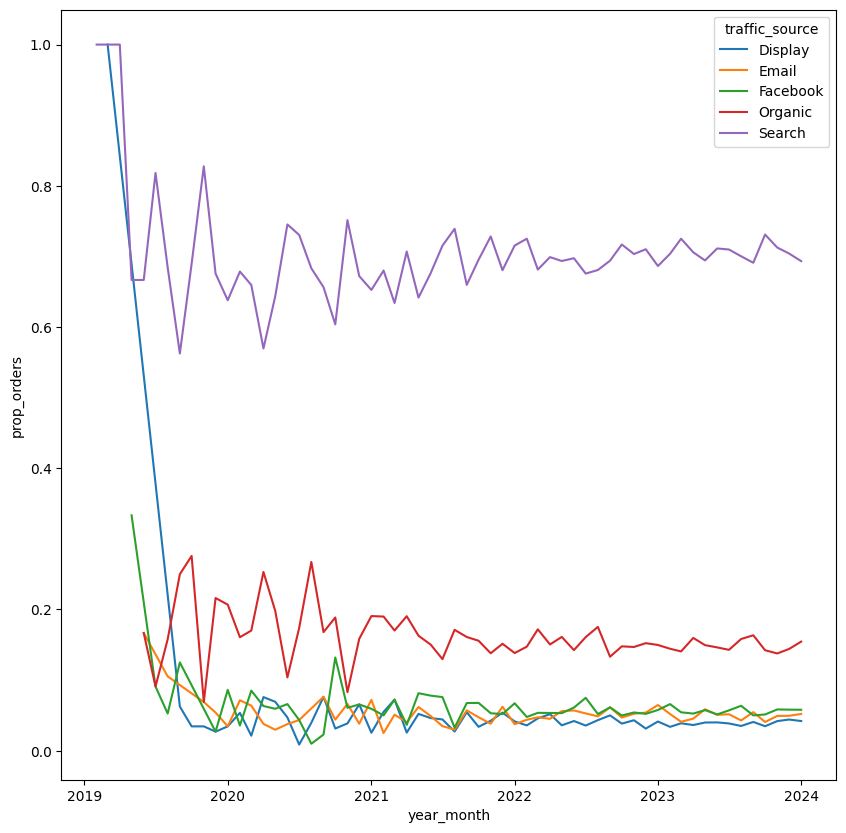

In [28]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.lineplot(data=time_channel_props, x='year_month', y='prop_orders', hue='traffic_source', ax=ax)

In [29]:
last_month_props = time_channel_props[time_channel_props['year_month'] == '2024-01-01 00:00:00']

In [30]:
tot_channel_props['tot_order_prop'].values - last_month_props['prop_orders'].values

array([-0.00147289, -0.00238284, -0.00102921, -0.00349142,  0.00837635])

### Number of repeated orders / number of total orders (total and by mont)

In [57]:
n_repeated_user_orders = repeated_user_orders.groupby(['year_month', 'traffic_source', 'age_bin', 'gender', 'country'], observed=False).agg(
    n_rep_orders=('order_id', 'count')
).reset_index()

# now find the total number of orders for each of these groups


In [58]:
n_repeated_user_orders

,year_month,traffic_source,age_bin,gender,country,n_rep_orders
0,2019-02-01,Display,"[10, 20)",F,Australia,0
1,2019-02-01,Display,"[10, 20)",F,Belgium,0
2,2019-02-01,Display,"[10, 20)",F,Brasil,0
3,2019-02-01,Display,"[10, 20)",F,China,0
4,2019-02-01,Display,"[10, 20)",F,Colombia,0
...,...,...,...,...,...,...
58795,2024-01-01,Search,"[70, 80)",M,Poland,0
58796,2024-01-01,Search,"[70, 80)",M,South Korea,0
58797,2024-01-01,Search,"[70, 80)",M,Spain,0
58798,2024-01-01,Search,"[70, 80)",M,United Kingdom,0


In [59]:
user_orders = users.merge(orders.merge(order_items, on='order_id'), left_on='id', right_on='order_id')

user_orders['year_month'] = user_orders['created_at_x'].dt.to_period('M').dt.to_timestamp()
user_orders['age_bin'] = pd.cut(
    user_orders['age'],
    bins=range(10, 81, 10),
    right=False
)
user_orders = user_orders.groupby(['year_month', 'traffic_source', 'age_bin', 'gender_x', 'country'], observed=False).agg(
    n_orders=('order_id', 'count')
).reset_index().rename(columns={'gender_x': 'gender'})

In [62]:
user_orders

,year_month,traffic_source,age_bin,gender,country,n_orders
0,2019-01-01,Display,"[10, 20)",F,Australia,0
1,2019-01-01,Display,"[10, 20)",F,Austria,0
2,2019-01-01,Display,"[10, 20)",F,Belgium,0
3,2019-01-01,Display,"[10, 20)",F,Brasil,0
4,2019-01-01,Display,"[10, 20)",F,China,0
...,...,...,...,...,...,...
68315,2024-01-01,Search,"[70, 80)",M,Poland,0
68316,2024-01-01,Search,"[70, 80)",M,South Korea,5
68317,2024-01-01,Search,"[70, 80)",M,Spain,1
68318,2024-01-01,Search,"[70, 80)",M,United Kingdom,3


In [72]:
prop_repeat_user_orders = user_orders.merge(n_repeated_user_orders, how='left', on=['year_month', 'traffic_source', 'age_bin', 'gender', 'country'])
prop_repeat_user_orders['n_rep_orders'] = prop_repeat_user_orders['n_rep_orders'].fillna(0).astype(int)
prop_repeat_user_orders

,year_month,traffic_source,age_bin,gender,country,n_orders,n_rep_orders
0,2019-01-01,Display,"[10, 20)",F,Australia,0,0
1,2019-01-01,Display,"[10, 20)",F,Austria,0,0
2,2019-01-01,Display,"[10, 20)",F,Belgium,0,0
3,2019-01-01,Display,"[10, 20)",F,Brasil,0,0
4,2019-01-01,Display,"[10, 20)",F,China,0,0
...,...,...,...,...,...,...,...
68315,2024-01-01,Search,"[70, 80)",M,Poland,0,0
68316,2024-01-01,Search,"[70, 80)",M,South Korea,5,0
68317,2024-01-01,Search,"[70, 80)",M,Spain,1,0
68318,2024-01-01,Search,"[70, 80)",M,United Kingdom,3,0


In [77]:
# visualisation
tot_prop_repeat_user_orders = prop_repeat_user_orders.groupby(['year_month']).agg(
    n_orders=('n_orders', 'sum'),
    n_rep_orders=('n_rep_orders', 'sum')
)
tot_prop_repeat_user_orders['prop_r_orders'] = tot_prop_repeat_user_orders['n_rep_orders'] / tot_prop_repeat_user_orders['n_orders']
tot_prop_repeat_user_orders

,n_orders,n_rep_orders,prop_r_orders
year_month,,,
2019-01-01,25,0,0.000000
2019-02-01,41,1,0.024390
2019-03-01,101,1,0.009901
2019-04-01,128,1,0.007812
2019-05-01,193,3,0.015544
...,...,...,...
2023-09-01,6312,2379,0.376901
2023-10-01,7061,2825,0.400085
2023-11-01,7966,3267,0.410118


<Axes: xlabel='prop_r_orders', ylabel='year_month'>

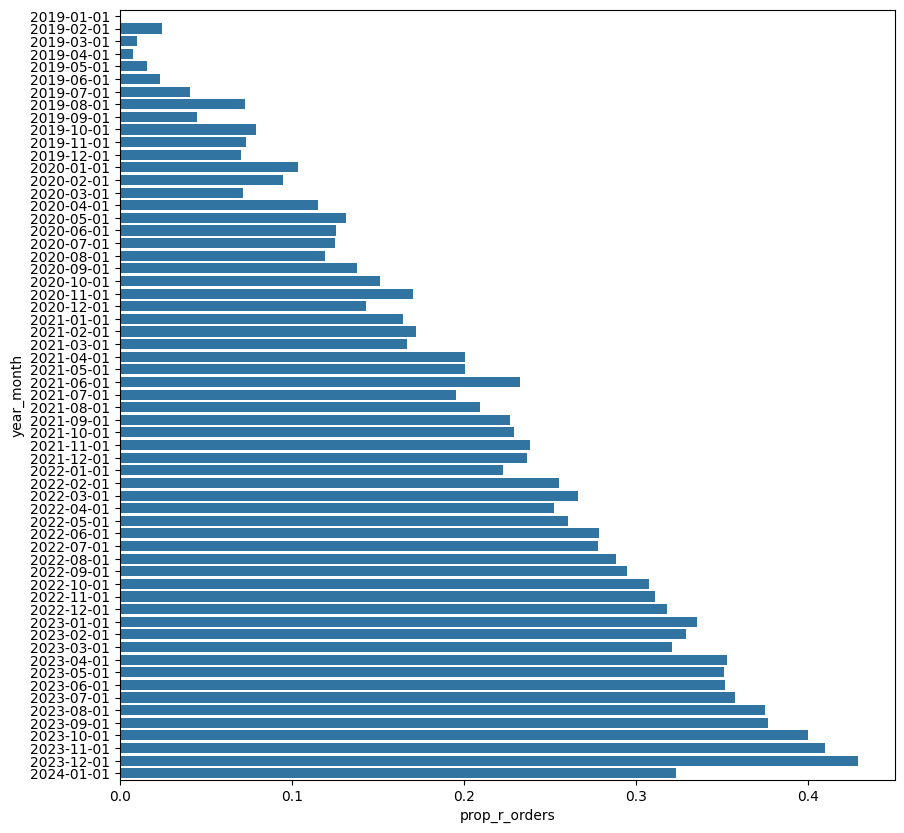

In [80]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.barplot(data=tot_prop_repeat_user_orders, x='prop_r_orders', y='year_month', ax=ax)

In [87]:
v

['age_bin', 'gender', 'country', 'traffic_source']

In [98]:
tot_prop_repeat_user_orders = prop_repeat_user_orders.groupby(['year_month', v[0]]).agg(
    n_orders=('n_orders', 'sum'),
    n_rep_orders=('n_rep_orders', 'sum')
).reset_index()
tot_prop_repeat_user_orders['prop_r_orders'] = tot_prop_repeat_user_orders['n_rep_orders'] / tot_prop_repeat_user_orders['n_orders']
tot_prop_repeat_user_orders

/tmp/ipykernel_4699/2253896986.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  tot_prop_repeat_user_orders = prop_repeat_user_orders.groupby(['year_month', v[0]]).agg(


,year_month,age_bin,n_orders,n_rep_orders,prop_r_orders
0,2019-01-01,"[10, 20)",2,0,0.000000
1,2019-01-01,"[20, 30)",3,0,0.000000
2,2019-01-01,"[30, 40)",4,0,0.000000
3,2019-01-01,"[40, 50)",9,0,0.000000
4,2019-01-01,"[50, 60)",3,0,0.000000
...,...,...,...,...,...
422,2024-01-01,"[30, 40)",1769,511,0.288864
423,2024-01-01,"[40, 50)",1757,584,0.332385
424,2024-01-01,"[50, 60)",1797,566,0.314969
425,2024-01-01,"[60, 70)",1743,558,0.320138


<Axes: xlabel='year_month', ylabel='prop_r_orders'>

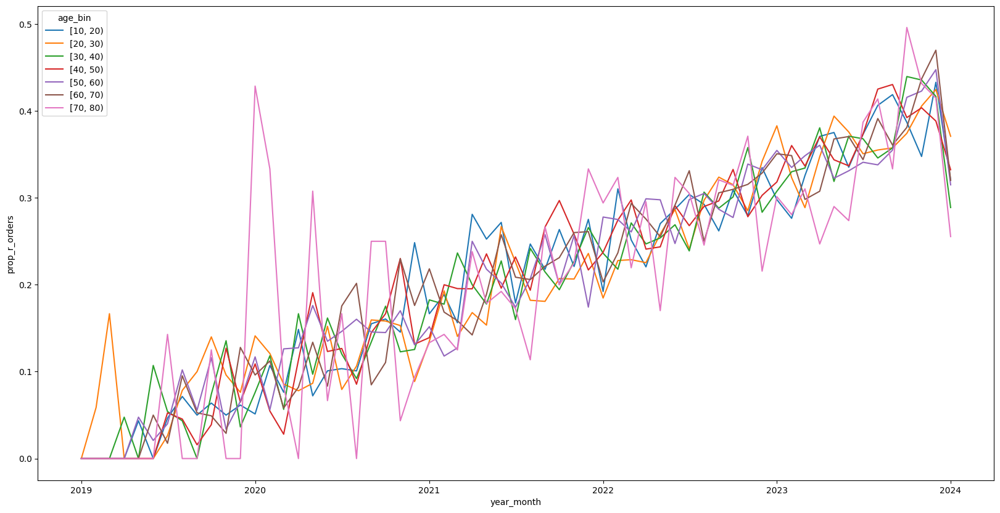

In [99]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(data=tot_prop_repeat_user_orders, x='year_month', y='prop_r_orders', ax=ax, hue=v[0])

In [101]:
tot_prop_repeat_user_orders = prop_repeat_user_orders.groupby(['year_month', v[1]]).agg(
    n_orders=('n_orders', 'sum'),
    n_rep_orders=('n_rep_orders', 'sum')
).reset_index()
tot_prop_repeat_user_orders['prop_r_orders'] = tot_prop_repeat_user_orders['n_rep_orders'] / tot_prop_repeat_user_orders['n_orders']
tot_prop_repeat_user_orders

,year_month,gender,n_orders,n_rep_orders,prop_r_orders
0,2019-01-01,F,15,0,0.000000
1,2019-01-01,M,10,0,0.000000
2,2019-02-01,F,27,1,0.037037
3,2019-02-01,M,14,0,0.000000
4,2019-03-01,F,45,1,0.022222
...,...,...,...,...,...
117,2023-11-01,M,3870,1632,0.421705
118,2023-12-01,F,4816,2057,0.427118
119,2023-12-01,M,4841,2087,0.431109
120,2024-01-01,F,5163,1720,0.333140


<Axes: xlabel='year_month', ylabel='prop_r_orders'>

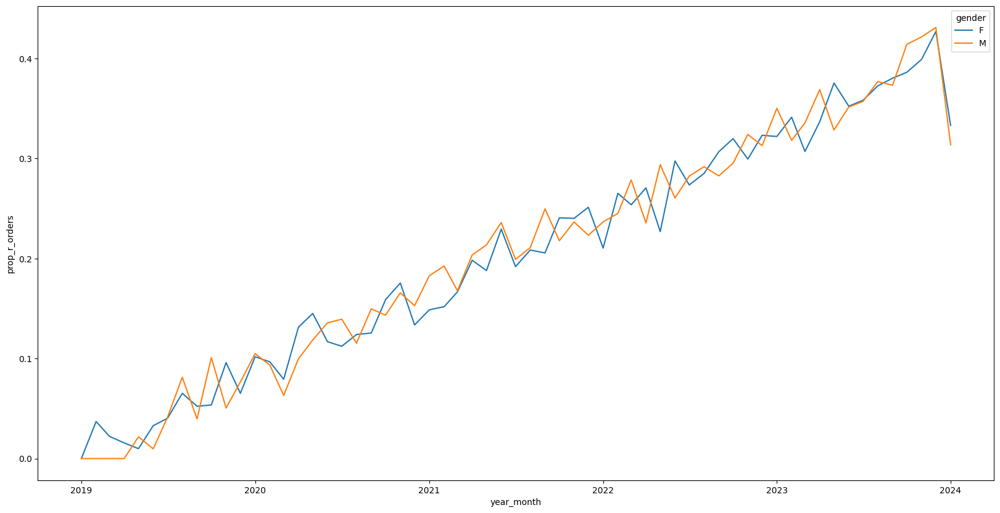

In [102]:
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(data=tot_prop_repeat_user_orders, x='year_month', y='prop_r_orders', ax=ax, hue=v[1])

In [103]:
tot_prop_repeat_user_orders = prop_repeat_user_orders.groupby(['year_month', v[2]]).agg(
    n_orders=('n_orders', 'sum'),
    n_rep_orders=('n_rep_orders', 'sum')
).reset_index()
tot_prop_repeat_user_orders['prop_r_orders'] = tot_prop_repeat_user_orders['n_rep_orders'] / tot_prop_repeat_user_orders['n_orders']
tot_prop_repeat_user_orders

,year_month,country,n_orders,n_rep_orders,prop_r_orders
0,2019-01-01,Australia,2,0,0.000000
1,2019-01-01,Austria,0,0,NaN
2,2019-01-01,Belgium,0,0,NaN
3,2019-01-01,Brasil,0,0,NaN
4,2019-01-01,China,8,0,0.000000
...,...,...,...,...,...
971,2024-01-01,Poland,14,12,0.857143
972,2024-01-01,South Korea,579,178,0.307427
973,2024-01-01,Spain,437,131,0.299771
974,2024-01-01,United Kingdom,474,163,0.343882


<Axes: xlabel='year_month', ylabel='prop_r_orders'>

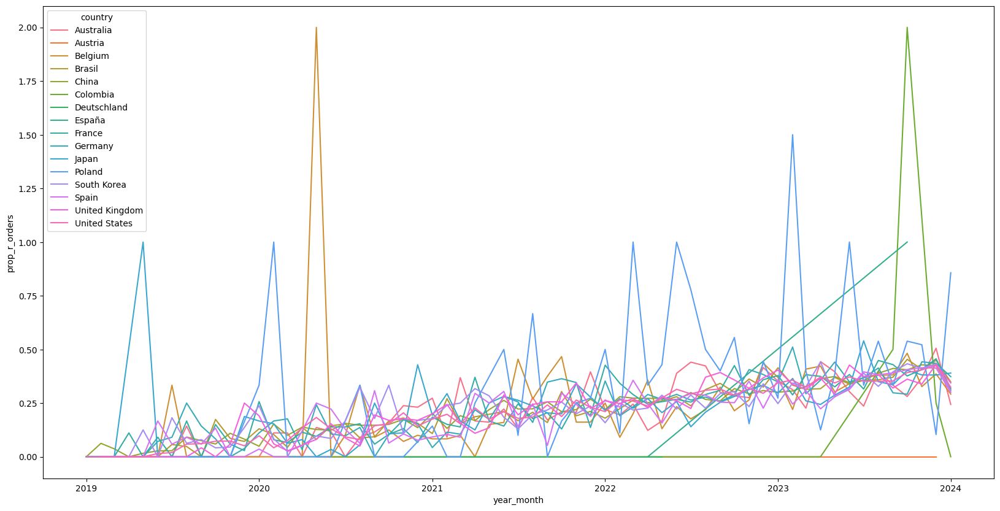

In [104]:
# there must be some errors
fig, ax = plt.subplots(figsize=(20, 10))
sns.lineplot(data=tot_prop_repeat_user_orders, x='year_month', y='prop_r_orders', ax=ax, hue=v[2])

### Which customer behaviours best predict long-term value (e.g. first-purchase category, AOV, time to second order), where long-term value is defined by revenue, profit, and repeat purchases?
Metrics of interest: Long term value
- Total revenue
- Total Profit
- Repeat purchases
Dimensions of interest
- Acquisition channel
- Gender
- Country
- Age
- average order value
Other behaviours
- Average order value (bins)
- timet to second order (bins)
- first purchase category (bins)
    - Department
    - Category
    - Total order price

Actions
for each person add values according to their
- Total revenue
- Total profit
- Repeat purchases (orders)

Include
- Acquisition channel
- Gender
- Country
- Age + age bin
- Average order value + bin
- Time to second purchase + bin
- Most common category
- Most common department
- First order total revenue + bin


In [47]:
# first orders, then order items, then products

In [48]:
user_order_itms = users.merge(orders, left_on='id', right_on='user_id').merge(order_items, on='order_id').merge(products, left_on='product_id', right_on='id')
user_order_itms['month'] = user_order_itms['created_at_y'].dt.to_period('M')
user_order_itms['month'] = user_order_itms['month'].dt.to_timestamp()
user_order_itms['age_bin'] = pd.cut(
    user_order_itms['age'],
    bins=range(10, 81, 10),
    right=False
)
user_order_itms

,id_x,first_name,last_name,email,age,gender_x,state,street_address,postal_code,city,...,cost,category,name,brand,retail_price,department,sku,distribution_center_id,month,age_bin
0,457,Timothy,Bush,timothybush@example.net,65,M,Acre,87620 Johnson Hills,69917-400,Rio Branco,...,39.70,Suits & Sport Coats,Haggar Men's Shadow Stripe 2-Button Center Ven...,Haggar,99.99,Men,8671E7B4D35F3D498F22E225DBE70BD9,6,2023-10-01,"[60, 70)"
1,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,12.17,Suits & Sport Coats,Allegra K Men Worsted Long Sleeve Padded Shoul...,Allegra K,29.97,Men,8EB42DB3C9772AF6DBA6F1B9F7095FEB,9,2020-05-01,"[10, 20)"
2,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,8.79,Sleep & Lounge,Private Label - Mens Plaid Broadcloth Robe Bla...,Private Label,23.12,Men,5F7733DE9C8BDDEB31B24D3434640003,3,2021-01-01,"[10, 20)"
3,36280,Christopher,Mendoza,christophermendoza@example.net,13,M,Acre,125 Turner Isle Apt. 264,69917-400,Rio Branco,...,24.01,Shorts,Hurley Men's Sinatra Walkshort,Hurley,49.00,Men,A797A65AA8651D8B93208615C6E0D01F,1,2021-01-01,"[10, 20)"
4,60193,Jimmy,Conner,jimmyconner@example.com,64,M,Acre,0966 Jose Branch Apt. 008,69917-400,Rio Branco,...,15.31,Socks,Smartwool NEW Men's PhD Running Light Micro wi...,SmartWool,24.00,Men,A6B25CC04DE4031B55EF0AEF421EC4A4,2,2021-03-01,"[60, 70)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181754,57045,Olivia,Wiley,oliviawiley@example.org,53,F,Île-de-France,749 Ronald Forge,77320,Choisy-en-Brie,...,22.68,Active,Moving Comfort Women's Juno Bra,Moving Comfort,56.00,Women,3430095C577593AAD3C39C701712BCFE,3,2021-09-01,"[50, 60)"
181755,73312,Emily,Bird,emilybird@example.org,16,F,Île-de-France,78117 Anderson Oval,77320,Choisy-en-Brie,...,5.06,Intimates,Vanity Fair Women's Smooth Moves Brief Panty #...,Vanity Fair,9.50,Women,63E8E3643E7F7198858EEF325B0600F9,2,2023-08-01,"[10, 20)"
181756,73312,Emily,Bird,emilybird@example.org,16,F,Île-de-France,78117 Anderson Oval,77320,Choisy-en-Brie,...,35.12,Fashion Hoodies & Sweatshirts,Coolibar UPF 50+ Women's ZnO Cabana Hoodie - S...,Coolibar,69.00,Women,3A1DD98341FAFC1DFE9BCF36360E6B84,5,2023-08-01,"[10, 20)"
181757,77764,Deborah,Andrews,deborahandrews@example.com,67,F,Île-de-France,922 Jeffrey Station,77320,Choisy-en-Brie,...,87.55,Jeans,7 For All Mankind Women's Midrise Bootcut Jean,7 For All Mankind,170.99,Women,038D5463327ADDF90D282C35BE4C5EB1,8,2023-08-01,"[60, 70)"


In [49]:
user_value = user_order_itms.groupby(['id_x', 'traffic_source', 'age', 'age_bin', 'gender_x', 'country'], observed=True).agg(
    tot_rev=('sale_price', 'sum'),
    tot_cost=('cost', 'sum'),
    n_ords=('order_id', 'nunique')
).reset_index()
user_value['aov'] = user_value['tot_rev'] / user_value['n_ords']
user_value['tot_profit'] = user_value['tot_rev'] - user_value['tot_cost']
user_value['aop'] = user_value['tot_profit'] / user_value['n_ords']
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840
...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970


In [50]:
# time to second purchase
# first sort by id_x and created_at
user_order_itms = user_order_itms.sort_values(['id_x', 'created_at_y'])

In [51]:
# group by
order_orders = user_order_itms.groupby(['id_x', 'order_id'], as_index=False).agg(
    created=('created_at_y', 'min')
)
order_orders = order_orders.sort_values(['id_x', 'created'])
order_orders['order_n'] = order_orders.groupby('id_x').cumcount()
order_orders

,id_x,order_id,created,order_n
0,1,1,2022-07-18 12:55:00,0
1,2,2,2022-02-20 10:34:00,0
4,3,5,2023-03-10 09:13:00,0
5,3,6,2023-04-02 09:13:00,1
2,3,3,2023-04-23 09:13:00,2
...,...,...,...,...
125221,99998,125222,2023-01-28 07:27:00,1
125222,99998,125223,2023-07-22 07:27:00,2
125223,99999,125224,2023-12-22 11:29:00,0
125225,100000,125226,2020-08-29 03:04:00,0


In [52]:
second_order_gap = order_orders.query('order_n in [0, 1]').pivot(index='id_x', columns='order_n', values='created')
second_order_gap

order_n,0,1
id_x,,
1,2022-07-18 12:55:00,NaT
2,2022-02-20 10:34:00,NaT
3,2023-03-10 09:13:00,2023-04-02 09:13:00
4,2022-10-18 09:31:00,NaT
5,2022-10-20 10:03:00,NaT
...,...,...
99993,2024-01-03 03:09:00,NaT
99996,2020-08-02 02:00:00,2023-03-13 02:00:00
99998,2022-12-16 07:27:00,2023-01-28 07:27:00


In [53]:
second_order_gap['time_to_second_order (days)'] = (
    second_order_gap[1] - second_order_gap[0]
).dt.days
second_order_gap = second_order_gap.reset_index()
second_order_gap
second_order_gap

order_n,id_x,0,1,time_to_second_order (days)
0,1,2022-07-18 12:55:00,NaT,NaN
1,2,2022-02-20 10:34:00,NaT,NaN
2,3,2023-03-10 09:13:00,2023-04-02 09:13:00,23.0
3,4,2022-10-18 09:31:00,NaT,NaN
4,5,2022-10-20 10:03:00,NaT,NaN
...,...,...,...,...
80039,99993,2024-01-03 03:09:00,NaT,NaN
80040,99996,2020-08-02 02:00:00,2023-03-13 02:00:00,953.0
80041,99998,2022-12-16 07:27:00,2023-01-28 07:27:00,43.0
80042,99999,2023-12-22 11:29:00,NaT,NaN


In [54]:
user_value = user_value.merge(second_order_gap.reset_index()[['id_x', 'time_to_second_order (days)']], on='id_x')
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop,time_to_second_order (days)
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860,NaN
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620,NaN
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335,23.0
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430,NaN
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450,NaN
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090,953.0
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090,43.0
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970,NaN


In [55]:
first_order = order_orders[order_orders['order_n'] == 0]
first_order.merge(order_items, on='order_id')

,id_x,order_id,created,order_n,id,user_id,product_id,inventory_item_id,status,created_at,shipped_at,delivered_at,returned_at,sale_price
0,1,1,2022-07-18 12:55:00,0,1,1,2953,3,Shipped,2022-07-20 10:32:05,2022-07-20 16:42:00,NaT,NaT,15.00
1,1,1,2022-07-18 12:55:00,0,3,1,7656,9,Shipped,2022-07-19 11:29:28,2022-07-20 16:42:00,NaT,NaT,19.99
2,1,1,2022-07-18 12:55:00,0,2,1,4731,7,Shipped,2022-07-20 11:05:38,2022-07-20 16:42:00,NaT,NaT,125.00
3,2,2,2022-02-20 10:34:00,0,4,2,25774,11,Complete,2022-02-20 10:28:57,2022-02-22 12:23:00,2022-02-23 18:29:00,NaT,22.00
4,3,5,2023-03-10 09:13:00,0,7,3,18177,18,Shipped,2023-03-10 07:14:45,2023-03-11 12:33:00,NaT,NaT,109.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116107,99996,125219,2020-08-02 02:00:00,0,181749,99996,27368,490678,Processing,2020-08-01 23:33:20,NaT,NaT,NaT,40.00
116108,99998,125221,2022-12-16 07:27:00,0,181753,99998,19164,490690,Processing,2022-12-16 06:35:21,NaT,NaT,NaT,40.00
116109,99999,125224,2023-12-22 11:29:00,0,181756,99999,25959,490697,Shipped,2023-12-23 08:59:09,2023-12-24 00:44:00,NaT,NaT,25.00
116110,99999,125224,2023-12-22 11:29:00,0,181757,99999,20828,490700,Shipped,2023-12-23 11:33:17,2023-12-24 00:44:00,NaT,NaT,42.98


In [56]:
first_order = order_orders[order_orders['order_n'] == 0]
first_order_rev = first_order.merge(order_items, on='order_id').groupby('id_x').agg(
    first_order_rev = ('sale_price', 'sum')
).reset_index()
first_order_rev

,id_x,first_order_rev
0,1,159.99
1,2,22.00
2,3,109.99
3,4,148.00
4,5,65.65
...,...,...
80039,99993,26.00
80040,99996,61.00
80041,99998,40.00
80042,99999,67.98


In [57]:
user_value = user_value.merge(first_order_rev, on='id_x')

In [58]:
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop,time_to_second_order (days),first_order_rev
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860,NaN,159.99
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620,NaN,22.00
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335,23.0,109.99
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430,NaN,148.00
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840,NaN,65.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450,NaN,26.00
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090,953.0,61.00
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090,43.0,40.00
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970,NaN,67.98


In [59]:
# now most common category
# we break ties by revenue
most_common_cat = user_order_itms.groupby(['id_x', 'category']).agg(
    n_items=('id_y', 'count'),
    cost=('cost', 'sum')
).reset_index()
most_common_cat = most_common_cat.sort_values(['id_x', 'n_items', 'cost'], ascending=False)
most_common_cat['category_pop'] = most_common_cat.groupby('id_x').cumcount()
most_common_cat = most_common_cat[most_common_cat['category_pop'] == 0][['id_x', 'category']]

user_value = user_value.merge(most_common_cat, on='id_x', how='left')
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop,time_to_second_order (days),first_order_rev,category
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860,NaN,159.99,Jeans
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620,NaN,22.00,Underwear
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335,23.0,109.99,Active
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430,NaN,148.00,Sweaters
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840,NaN,65.65,Sweaters
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450,NaN,26.00,Sleep & Lounge
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090,953.0,61.00,Socks
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090,43.0,40.00,Tops & Tees
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970,NaN,67.98,Jeans


In [60]:
# now most common department
# we break ties by revenue
most_common_dep = user_order_itms.groupby(['id_x', 'department']).agg(
    n_items=('id_y', 'count'),
    cost=('cost', 'sum')
).reset_index()


most_common_dep = most_common_dep.sort_values(['id_x', 'n_items', 'cost'], ascending=False)
most_common_dep['dep_pop'] = most_common_dep.groupby('id_x').cumcount()
most_common_dep = most_common_dep[most_common_dep['dep_pop'] == 0][['id_x', 'department']]

user_value = user_value.merge(most_common_dep, on='id_x')
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop,time_to_second_order (days),first_order_rev,category,department
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860,NaN,159.99,Jeans,Women
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620,NaN,22.00,Underwear,Men
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335,23.0,109.99,Active,Men
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430,NaN,148.00,Sweaters,Women
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840,NaN,65.65,Sweaters,Women
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450,NaN,26.00,Sleep & Lounge,Women
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090,953.0,61.00,Socks,Men
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090,43.0,40.00,Tops & Tees,Men
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970,NaN,67.98,Jeans,Men


In [ ]:
user_order_itms['age_bin'] = pd.cut(
    user_order_itms['age'],
    bins=range(10, 81, 10),
    right=False
)

In [111]:
(user_value['first_order_rev'].min(),
 user_value['first_order_rev'].max())

(np.float64(0.49), np.float64(1341.49))

In [112]:
# finally bin behaviours into categories
user_value['ttso_bin'] = pd.cut(
    user_value['time_to_second_order (days)'],
    bins=range(0, 1750, 250),
    right=False
)
user_value['first_order_rev_bin'] = pd.cut(
    user_value['first_order_rev'],
    bins=range(0, 1500, 250),
    right=False
)

## Visualisations

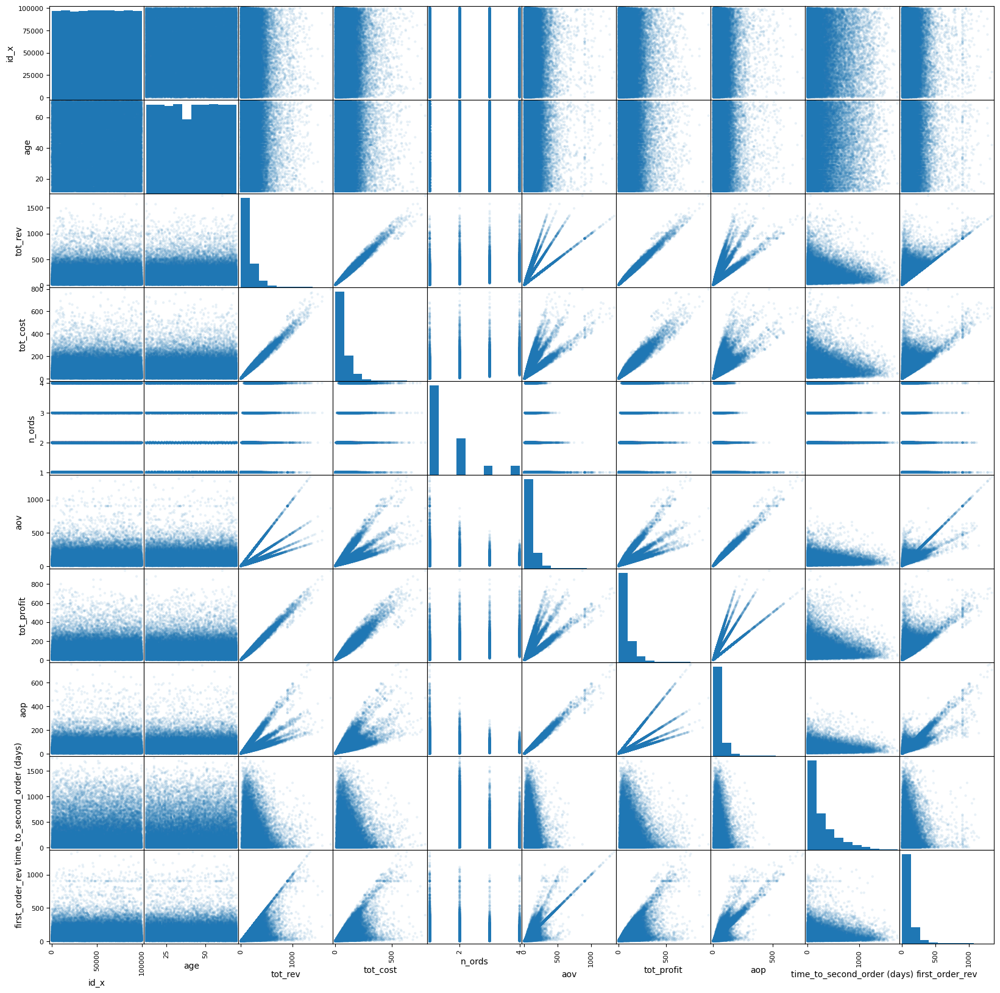

In [62]:
pd.plotting.scatter_matrix(user_value, alpha=0.1, diagonal='hist', figsize=(20, 20))
plt.show()

In [63]:
user_value

,id_x,traffic_source,age,age_bin,gender_x,country,tot_rev,tot_cost,n_ords,aov,tot_profit,aop,time_to_second_order (days),first_order_rev,category,department
0,1,Search,62,"[60, 70)",F,South Korea,159.99,81.13,1,159.990000,78.86,78.860,NaN,159.99,Jeans,Women
1,2,Organic,65,"[60, 70)",M,Brasil,22.00,10.38,1,22.000000,11.62,11.620,NaN,22.00,Underwear,Men
2,3,Organic,16,"[10, 20)",M,United States,402.20,196.86,4,100.550000,205.34,51.335,23.0,109.99,Active,Men
3,4,Search,12,"[10, 20)",F,United States,148.00,61.57,1,148.000000,86.43,86.430,NaN,148.00,Sweaters,Women
4,5,Organic,52,"[50, 60)",F,Brasil,65.65,28.81,1,65.650000,36.84,36.840,NaN,65.65,Sweaters,Women
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80039,99993,Search,17,"[10, 20)",F,Australia,26.00,15.55,1,26.000000,10.45,10.450,NaN,26.00,Sleep & Lounge,Women
80040,99996,Search,51,"[50, 60)",M,China,123.87,55.69,2,61.935000,68.18,34.090,953.0,61.00,Socks,Men
80041,99998,Search,51,"[50, 60)",M,United States,116.99,59.72,3,38.996667,57.27,19.090,43.0,40.00,Tops & Tees,Men
80042,99999,Search,13,"[10, 20)",M,Brasil,67.98,34.01,1,67.980000,33.97,33.970,NaN,67.98,Jeans,Men


Metrics of interest: Long term value
- Total revenue
- Total Profit
- aov
- aop
User characteristics
- Age
- Gender
- Country
User behaviours
- Acquisition channel
- time to second order
- first order revenue
- most common category
- most common department

In [113]:
ltv = ['tot_rev', 'tot_profit', 'aov', 'aop']
c = ['age', 'gender_x', 'country']
b = ['n_ords', 'time_to_second_order (days)', 'ttso_bin', 'first_order_rev', 'first_order_rev_bin', 'traffic_source', 'category', 'department']

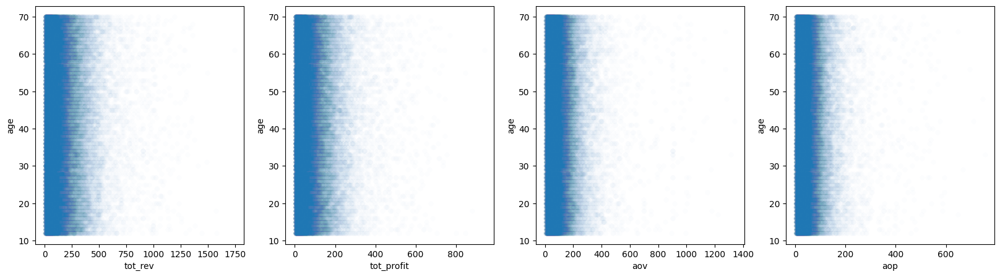

In [90]:
fig, ax = plt.subplots(1, len(ltv), figsize = (20, 5))
v = c[0]
for i in range(len(ltv)):
    sns.scatterplot(data=user_value, x=ltv[i], y = v, ax=ax[i], alpha=0.01)
plt.show()

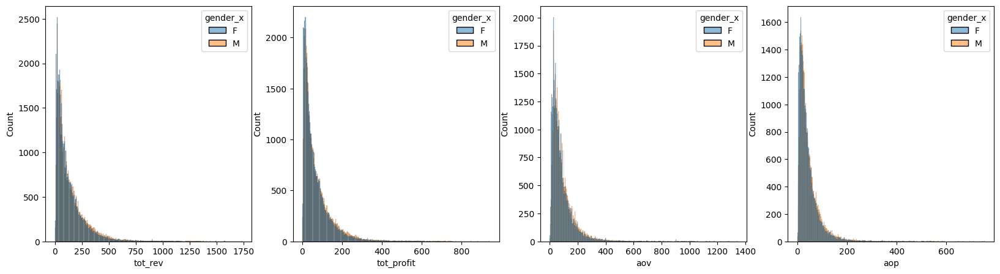

In [91]:
fig, ax = plt.subplots(1, len(ltv), figsize = (20, 5))
v = c[1]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

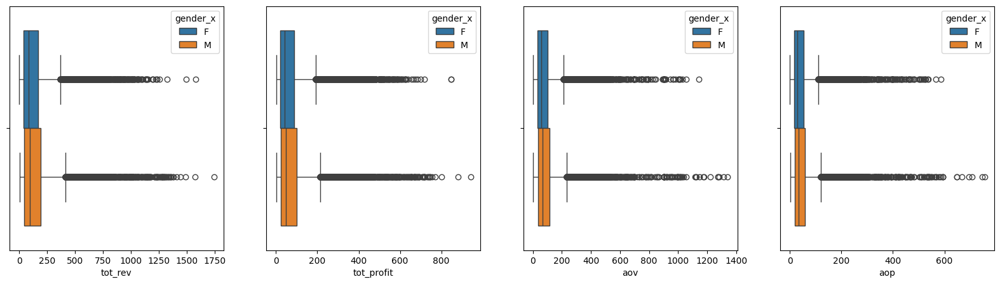

In [125]:
fig, ax = plt.subplots(1, len(ltv), figsize = (20, 5))
v = c[1]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

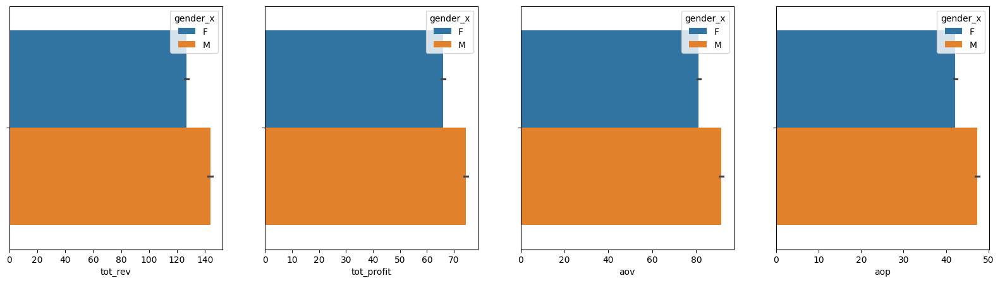

In [126]:
fig, ax = plt.subplots(1, len(ltv), figsize = (20, 5))
v = c[1]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

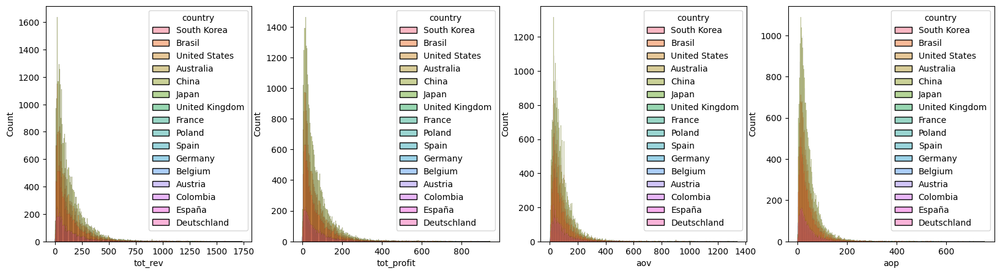

In [92]:
fig, ax = plt.subplots(1, len(ltv), figsize = (20, 5))
v = c[2]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

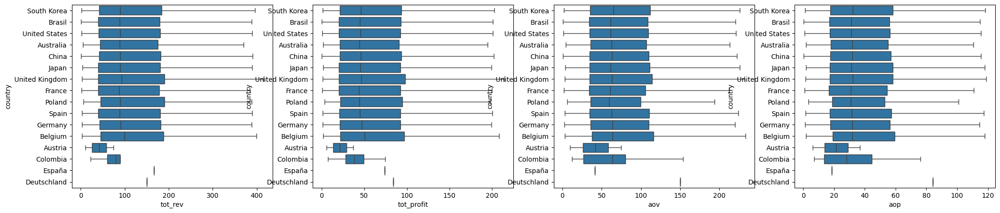

In [93]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = c[2]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], y = v, ax=ax[i], showfliers=False)
plt.show()

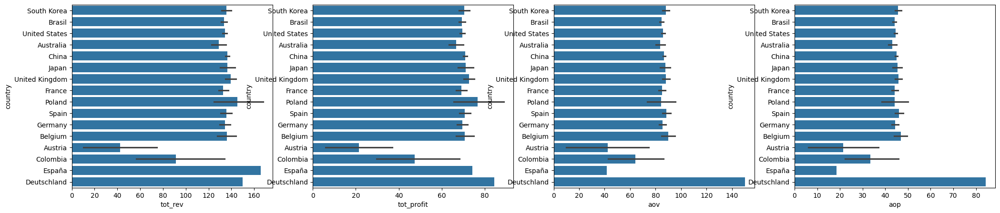

In [94]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = c[2]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], y = v, ax=ax[i])
plt.show()

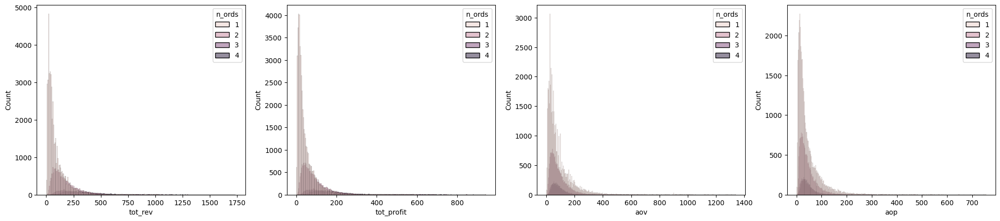

In [95]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[0]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

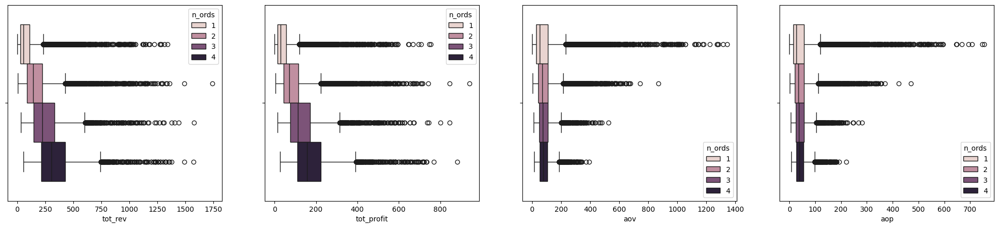

In [96]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[0]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

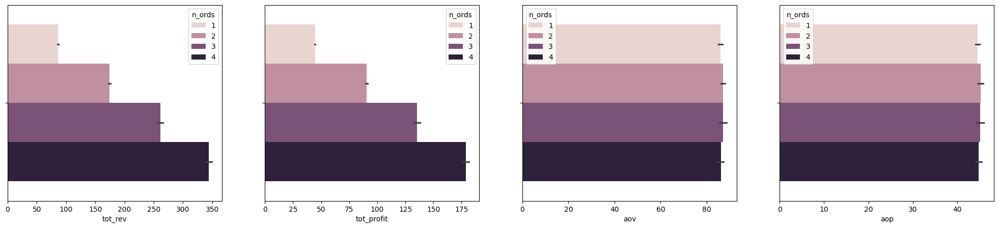

In [97]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[0]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

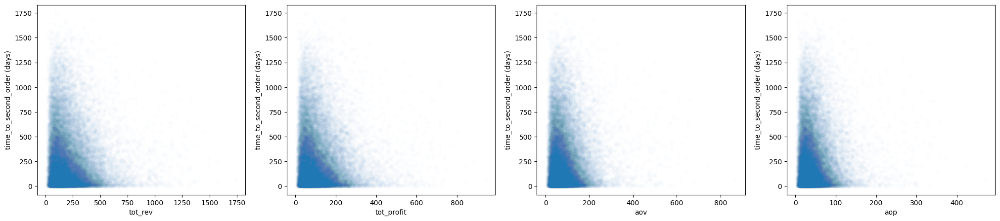

In [98]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[1]
for i in range(len(ltv)):
    sns.scatterplot(data=user_value, x=ltv[i], y = v, ax=ax[i], alpha=0.01)
plt.show()

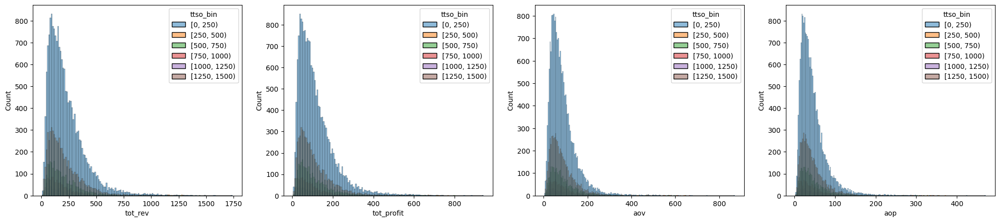

In [99]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[2]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

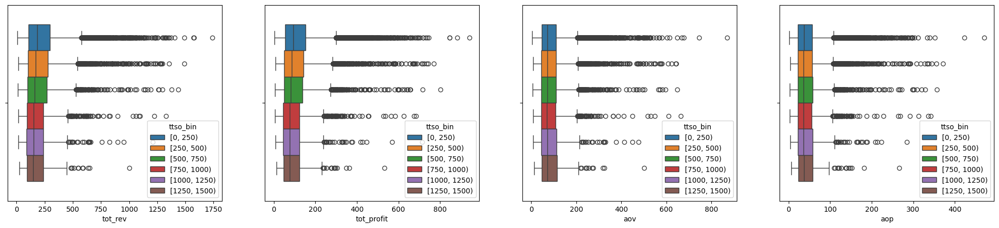

In [100]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[2]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

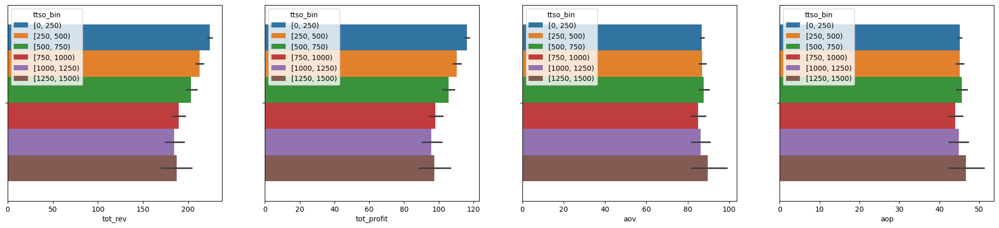

In [101]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[2]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

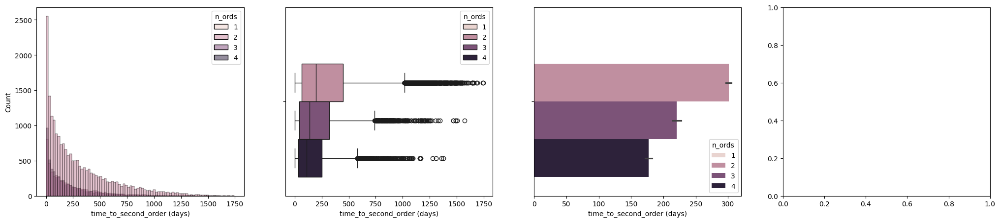

In [106]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[2]
sns.histplot(data=user_value, x='time_to_second_order (days)', hue = 'n_ords', ax=ax[0])
sns.boxplot(data=user_value, x='time_to_second_order (days)', hue = 'n_ords', ax=ax[1])
sns.barplot(data=user_value, x='time_to_second_order (days)', hue = 'n_ords', ax=ax[2])
plt.show()

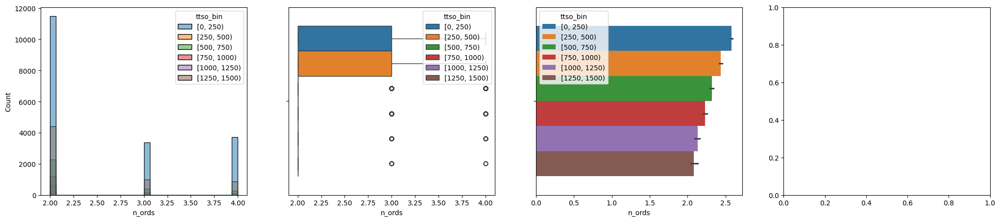

In [107]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[2]
sns.histplot(data=user_value, x='n_ords', hue = 'ttso_bin', ax=ax[0])
sns.boxplot(data=user_value, x='n_ords', hue = 'ttso_bin', ax=ax[1])
sns.barplot(data=user_value, x='n_ords', hue = 'ttso_bin', ax=ax[2])
plt.show()

In [108]:
b[3]

'first_order_rev'

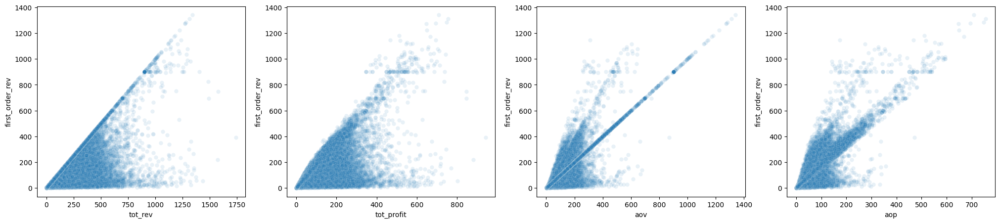

In [110]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[3]
for i in range(len(ltv)):
    sns.scatterplot(data=user_value, x=ltv[i], y = v, ax=ax[i], alpha=0.1)
plt.show()

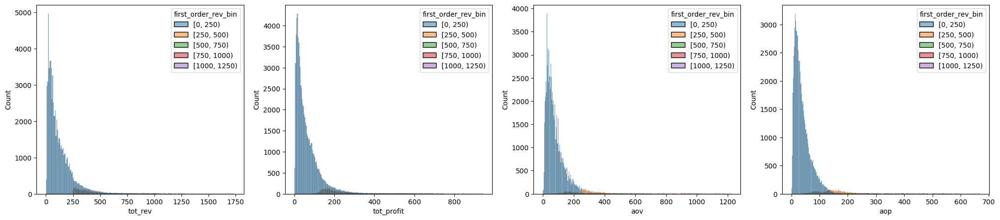

In [114]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[4]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

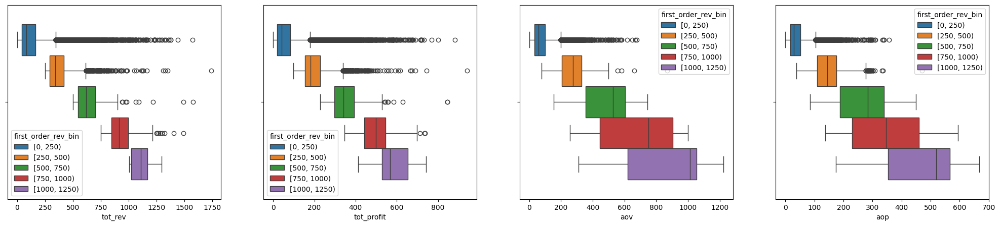

In [115]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[4]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

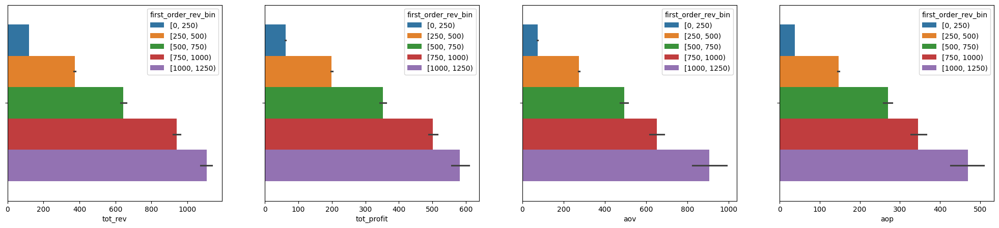

In [116]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[4]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

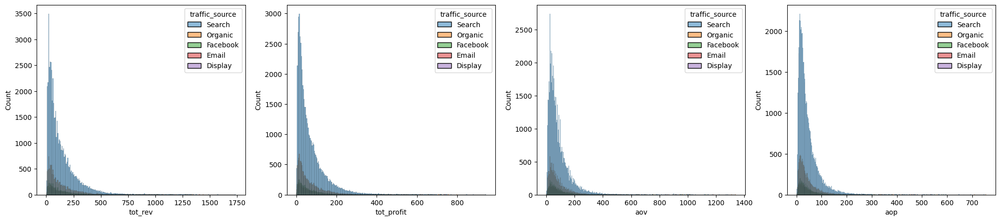

In [117]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[5]
for i in range(len(ltv)):
    sns.histplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

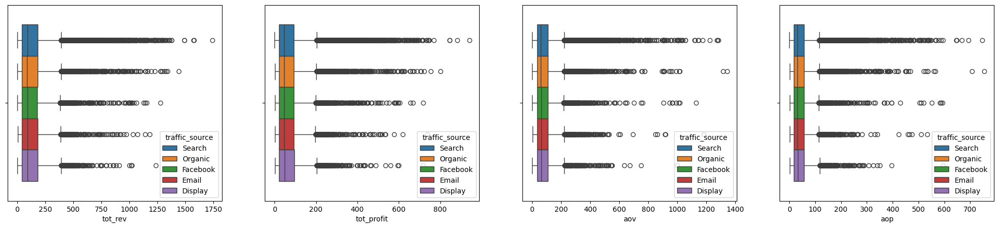

In [118]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[5]
for i in range(len(ltv)):
    sns.boxplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

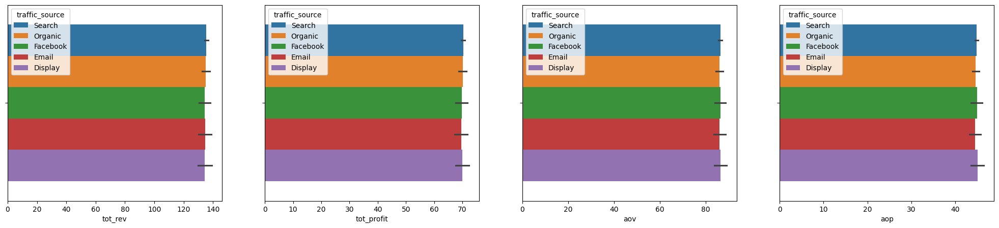

In [119]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[5]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

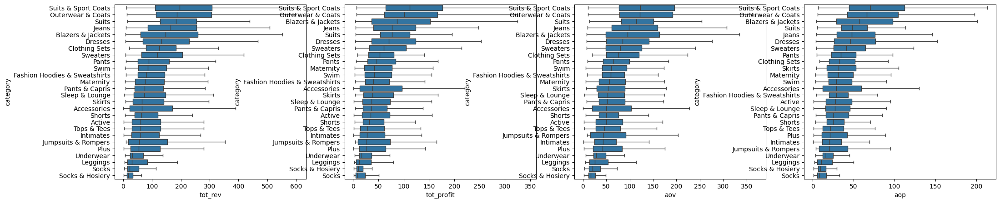

In [145]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[6]
for i in range(len(ltv)):
    v_order = user_value.groupby(v)[ltv[i]].median().sort_values(ascending=False).index
    sns.boxplot(data=user_value, x=ltv[i], y = v, ax=ax[i], order=v_order, showfliers=False)
plt.show()

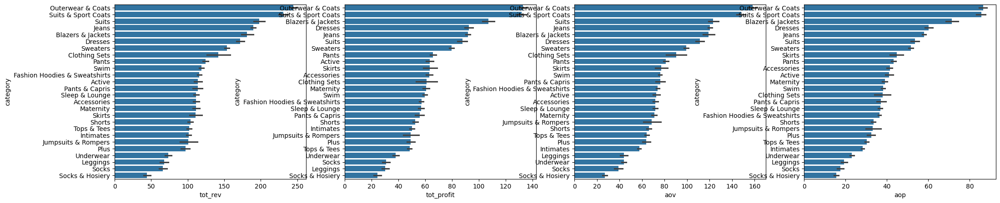

In [147]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[6]
for i in range(len(ltv)):
    v_order = user_value.groupby(v)[ltv[i]].mean().sort_values(ascending=False).index
    sns.barplot(data=user_value, x=ltv[i], y = v, ax=ax[i], order=v_order)
plt.show()

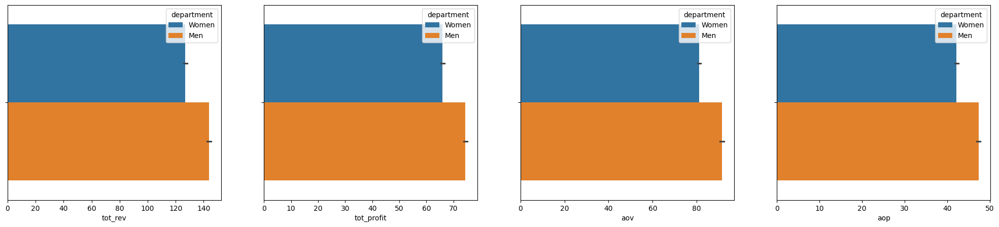

In [124]:
fig, ax = plt.subplots(1, len(ltv), figsize = (25, 5))
v = b[7]
for i in range(len(ltv)):
    sns.barplot(data=user_value, x=ltv[i], hue = v, ax=ax[i])
plt.show()

### Where do post-purchase drop-offs occur (e.g. returns, low engagement), and how do these vary by segment?